<a href="https://colab.research.google.com/github/VDMV/BDD_TFM_ENEMDU2023_MolinaV/blob/main/TFM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> TFM: Deserción educativa - ENEMDU (2023) <center>

**Nombre y apellidos:** Molina Valiente Vanessa Diana

**Usuario VIU:** vmolinav@student.universidadviu.com


---
# Librerías empleadas
---

In [60]:
import numpy as np
import pandas as pd

import statsmodels.api as sm
import statsmodels.formula.api as smf
import seaborn as sns

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.cm import get_cmap

from scipy.stats import norm
from scipy import stats
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.utils import resample
from sklearn import tree
from sklearn.tree import export_graphviz, DecisionTreeClassifier
from IPython.display import Image
import graphviz

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, silhouette_score, classification_report, roc_curve, roc_auc_score, average_precision_score, RocCurveDisplay, PrecisionRecallDisplay, precision_score, accuracy_score, recall_score, f1_score, make_scorer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.ensemble import IsolationForest, RandomForestClassifier
import plotly.graph_objects as go
from scipy.stats import randint as sp_randint



---
# Carga de fuente de datos, selección de población objetivo y contrucción de la variable objetivo
---


Se realiza la lectura de la base de datos de la Encuesta de Empleo, Subempleo y Desempleo del año 2023, publicada por el Instituto Nacional de Estadísticas y Censos que almacena un conjunto de datos que se puede encontrar en la página web de [Ecuador en cifras](https://www.ecuadorencifras.gob.ec/enemdu-anual/). Recolectado con datos de personas de 5 años y más de edad, residentes en los hogares del Ecuador con el fin de conocer la situación del mercado laboral, actividades económicas y fuentes de ingreso. Tiene **342.968 registros** y **141 variables.**

El conjunto con los datos originales es denominado ENEMDU.

In [195]:
ENEMDU = pd.read_csv("/content/BDDenemdu_personas_2023_anual.csv", sep=";", low_memory=False)

### Selección de variables de la BDD de la ENEMDU
Para estructurar el problema de clasificación binaria, según varios autores la deserción educativa se define en términos de necesidades educativas.

En base a ello, se han seleccionado las siguientes variables.

*   **Variable binaria que permitirá definir la variable objetivo:** p07 (Asiste a clases)
*   **Variables demográficas:** p02 (Sexo); p03 (Edad); p04 (Relación de parentesco); área
*   **Relacionadas con la educación:** p08 (Jornada a la que asiste); p10a (Nivel de instrucción); p10b (Año aprobado); p11 (Sabe leer y escribir); p12a (Obtuvo algún título); sd021 (Estudió o estuvo capacitándose - la semana pasada)
*   **Relacionadas con la participación laboral:** p20 (Trabajó la semana pasada); desempleo; empleo
*   **Relacionadas con los ingresos:** ingrl (Ingreso laboral)

Obteniendo un dataset con **342968** registros con **16** variables que permiten medir la deserción escolar o eduactiva, denominado  **enemdu**.

Es importante aclarar que el grupo de variables de la parte inferior se emplearon para el trataramiento de valores faltantes, bajo condiciones que se ajustan a la realidad del contexto nacional.

In [196]:
variables_a_seleccionar  = [
# Variable objetivo
    "p07",       # Educación: Asiste a clases
# Variables interdependientes
    "area",      # Ubicación geográfica: Urbana y Rural
    "p02",       # Demográfica: Sexo
    "p03",       # Demográfica: Edad
    "p04",       # Demográfica: Parentesco
    "ingrl",     # Socioeconómica: Ingreso laboral
    "desempleo", # Situación de desempleo

# Varriables auxiliares
    "p09",       # Educación: Razón de no asistencia
    "p10a",      # Educación: Nivel de instrucción
    "p10b",      # Educación: Año aprobado
    "p11",       # Educación: Sabe leer y escribir
    "p12a",      # Educación: Obtuvo algún título
    "p20",       # Socioeconómica: Trabajo la semana pasada
    "sd021",     # Educación: Estudió o estuvo capacitándose
    "p08",       # Educación: Jornada a la que asiste
    "empleo",    # Situación de empleo
]

aux = [c for c in variables_a_seleccionar if c in ENEMDU.columns]
enemdu = ENEMDU[aux].copy()
enemdu = enemdu.replace([' ', '', 'NA', 'na'], np.nan)

cat_cols = ["area","p02","p04","p07","p09", "p10a","p10b","p11","p12a","p20","sd021","desempleo", "empleo", "p08"]
num_cols = ["p03", "ingrl"]

for c in cat_cols:
    if c in enemdu.columns:
        enemdu[c] = enemdu[c].astype("category")

for c in num_cols:
    if c in enemdu.columns:
        enemdu[c] = pd.to_numeric(enemdu[c], errors="coerce")

print(enemdu.head())

  p07 area p02  p03 p04  ingrl desempleo p09 p10a p10b  p11 p12a p20 sd021  \
0   2    1   2   78   1    NaN       NaN   1    4    3    1  NaN   2   NaN   
1   2    1   1   79   1    NaN       NaN   3    4    6    1  NaN   2   NaN   
2   2    1   2   73   2    NaN       NaN   3    6    3  NaN  NaN   2   NaN   
3   2    1   1   46   1  646.0       NaN   5    9    3  NaN    2   1   NaN   
4   2    1   2   59   1    NaN       NaN   3    9    2  NaN    2   2   NaN   

   p08 empleo  
0  NaN    NaN  
1  NaN    NaN  
2  NaN    NaN  
3  NaN      1  
4  NaN    NaN  


### Definición de la Población Objetivo
Dirigida a adolescentes y jóvenes, en el rango de edad entre 12 y 19 años. Esto implica que se va a estudiar el estudio acerca de la deserción escolar en una muestra de 85.247 personas que residen en Ecuador, y en base a esta se van a obtener los resultados a discutir.


In [197]:
df = enemdu[(enemdu["p03"] >= 12) & (enemdu["p03"] <= 19)].copy()
print("Número de registros entre 12 y 19 años:", len(df))

Número de registros entre 12 y 19 años: 50692


### Construcción de la variable objetivo
La pregunta *"p07": Asiste a clases* permite delimitar parcialmente la población objetivo, al identificar a quienes actualmente participan en el sistema educativo. Sin embargo, esta variable por sí sola no permite segmentar completamente a la población afectada o no por el fenómeno de la deserción, dado que el análisis contempla la deserción tanto en los niveles de educación obligatorios como entre quienes cursan estudios en instituciones de educación superior pública.

In [198]:
for col in ["p07", "p03", "p10a", "p10b", "p12a"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

# Creación de la variable objetivo 'desercion'
condiciones = [
    (df["p07"] == 1),                                    # Asiste a clases
    (df["p07"] == 2) & (df["p03"] <= 18),                # No asiste y es menor o igual a 18 años
    (df["p07"] == 2) & (df["p10a"] < 7),                 # No asiste y no terminó bachillerato
    (df["p07"] == 2) & (df["p10a"] >= 7) & (df["p12a"] == 2),  # No asiste, tiene nivel superior sin título
    (df["p07"] == 2) & (df["p10a"] >= 7) & (df["p12a"] == 1),  # No asiste, tiene título
    (df["p07"] == 2) & (df["p10a"] == 7) & (df["p10b"] < 3),   # No asiste, nivel 7 pero menos de 3 años aprobados
    (df["p07"] == 2) & (df["p10a"] == 7) & (df["p10b"] == 3),  # Nivel 7 pero con 3 años aprobados culminó el bachillerato
]

cat_desercion = [
    0,  # Asiste / No deserción
    1,  # No asiste y es menor o igual a 18 años / Deserción en niveles obligatorios
    1,  # No terminó bachillerato / Deserción en niveles obligatorios
    1,  # Nivel superior sin título / Deserción en nivel de educación superior
    0,  # Nivel superior con título / No deserción
    1,  # No asiste, alcanzó el bachillerato pero tiene menos de 3 años aprobados / Deserción en niveles obligatorios
    0,  # Nivel 7 con 3 años aprobados / No deserción
]

df["desercion"] = np.select(condiciones, cat_desercion, default=np.nan)
df["desercion"] = df["desercion"].astype("Int64")

# 0: "No deserción", 1: "Deserción"
df["desercion"] = df["desercion"].astype("category")
df["desercion"].value_counts()

,count
desercion,
0,44206
1,6486


---
# Análisis exploratorio y preparación de los datos
---

### Identificación y tratamiento de valores faltantes
Los **valores faltantes de las variables seleccionadas de acuerdo al diseño del cuestionario, corresponden principalmente a saltos lógicos y no necesariamente a personas que omitieron su respuesta, o en efecto no sabían que responder**. Por ello, es importante diferenciar estos casos para el respectivo tratamiento.

Si los valores faltantes corrresponden a saltos lógicos entre preguntas se van a considerar como casos 'No aplica' para evitar que la información se distorsione, mientras que si son errores humanos o por falta de información se va a emplear las técnicas adecuadas según el caso.

Para ello, primero se presenta el porcentaje de valores nulos por variable.

In [199]:
(df.isna().mean() * 100).round(2)

,0
p07,0.00
area,0.00
p02,0.00
p03,0.00
p04,0.00
ingrl,93.46
desempleo,98.55
p09,82.33
p10a,0.00
p10b,0.28


Una vez se ha identificado la cantidad de valores faltantes especificamente de las variables predictoras, se va justificar el tratamiento de las variables.


**p09:** Razón por la que no asiste.

Si en la pregunta p07:Asiste a clases la respuesta fue "Si" no determina la ruta de respuesta para la pregunta p09: Razón por la que no asiste, por lo que no los valores faltantes son nuevamente casos que no aplican (se le asigno 0) y es así como se consideran.

In [200]:
df["p07"] = pd.to_numeric(df["p07"], errors="coerce")

df["p09"] = np.where(
    (df["p07"] == 1) | (df["p09"].isna()),  # condiciones
    "0",                                    # valor si cumple
    df["p09"].astype(str)                   # valor original convertido a texto
)

# Convertida a categoría
df["p09"] = pd.Categorical(df["p09"])


**p10b:** Año aprobado

Los valores faltantes en el año aprobado, corresponden a quienes indicaron en la pregunta p10a no tener ningún nivel de instrucción, por lo tanto, al ser la variable de tipo numérica la ausencia de años aprobados se representará con el número 0 debido a que no formaron parte del sistema educativo. Adicoanl a ello, se considera el tiempo máximos de duración en los niveles de eduación superior universitario y no universitario.


In [201]:
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")
df["p10b"] = pd.to_numeric(df["p10b"], errors="coerce")

df["p10b"] = np.select(
    [
        df["p10a"] == 1,                       # 0 años aprobados con ningún novel de instrucción
        (df["p10a"] == 9) & (df["p10b"] > 5),  # La duración legítima de estudios no excede los 5 años en el nivel superior universitario
    ],
    [
        0,  # ningún año aprobado
        5,  # máximo 5 años aprbados en educación superior
    ],
    default=df["p10b"]
)
# Convertida a categoría
df["p10b"] = pd.Categorical(df["p10b"].astype("Int64"))


**p11:** Sabe leer y escribir

Los valores faltantes en la pregunta p11: Sabe leer y escribir es significativo, por tanto para tratar estos valores se va a establecer consistencia con la pregunta sobre el nivel de instrucción, es decir, si el nivel de instrucción es ninguno (1: Ninguno) o sólo cursó el jardín de infantes (3; Jardín de infantes) se va a asumir que no saben leer ni escribir aunque no necesariamente es así, un grupo reducido de personas han aprendido por necesidad; mientras que por otro lado, quienes han asisitido a un centro de alfabetización (2), cursado algún año en la primaria(4) o de Educación General Básica (EGB) se asume saben leer y escribir.


In [202]:
df["p11"] = pd.to_numeric(df["p11"], errors="coerce")
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")

df["p11"] = np.select(
    [
        df["p11"].isna() & df["p10a"].isin([1, 3]),   # Ningún nivel de instrucción o jardín de infantes, no sabe leer y escribir
        df["p11"].isna() & df["p10a"].isin([x for x in range(2, 11) if x != 3])  # Cursaron al menos un año considerando los centros de alfabetización, sabe leer y escribir a excepción de Jadín de Infantes
    ],
    [
        2,  # no sabe leer ni escribir
        1   # sabe leer y escribir
    ],
    default=df["p11"]
)

# Convertida a categoría
df["p11"] = pd.Categorical(df["p11"].astype("Int64"),
                           categories=[1, 2],
                           ordered=True)


**p12a:** Por sus estudios obtuvo algún título

Teniendo en cuenta que se otorga títulos por culminar distintos niveles de formación, entre los que se encuentan algunos del nivel de instrucción (p10a) como, el bachillerto, la secundaria, el Superior Universitario y no universitario o alguna capacitación por educación técnica y formación complemetaria, sin embargo se debe considerar que para este tipo de capacitaciones se contempla deben cumplir con el requisito de haber culminado el bachillerato (7) o la secundaria (6).

In [203]:
df["p12a"] = pd.to_numeric(df["p12a"], errors="coerce")
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")

df["p12a"] = np.select(
    [
        df["p12a"].isna() & df["p10a"].isin([2, 6, 7, 8, 9, 10]),  # sí obtuvo título de centro de alfabetización, secundario, superior universitario o no universitario y postgrado
        df["p12a"].isna() & df["p10a"].isin([1, 3, 4, 5])          # no aplica titulación por ser jardín de infantes, primaria y educación básica
    ],
    [
        1,  # sí obtuvo título
        2   # no obtuvo título
    ],
    default=df["p12a"]
)

# Convertida a categoría
df["p12a"] = pd.Categorical(df["p12a"].astype("Int64"),
                            categories=[1, 2],
                            ordered=True)


**sd021:** Estudió o estuvo capacitandose la semana pasada

Para el tratamiento de los valores faltantes de esta variable, se va a considerar la pregunta p07: Asiste a clases. Con base en esta información, quienes respondieron que "Si" deberían haber indicado que si ya que implica constancia, para mantener la coherencia de los datos y validar la información previamente registrada.



In [204]:
df["sd021"] = pd.to_numeric(df["sd021"], errors="coerce")
df["p07"] = pd.to_numeric(df["p07"], errors="coerce")

df["sd021"] = np.select(
    [
        df["sd021"].isna() & (df["p07"] == 1),  # asiste a clases, significa que esta estudiando
        df["sd021"].isna() & (df["p07"] == 2)   # no asiste a clases, es posible que no se encuentre estudiando ni capacitandose
    ],
    [
        1,  # está estudiando
        2   # no se encuentra estudiando ni capacitándose
    ],
    default=df["sd021"]
)

# Convertida a categoría
df["sd021"] = pd.Categorical(df["sd021"].astype("Int64"),
                             categories=[1, 2],
                             ordered=True)


**desempleo:** Buscando empleo activamente

En el caso de la variable, para el tratamiento de los valores faltantes se realizará la verificación de la pregunta p20: Trabajo la semana pasada que indaga sobre la situación laboral de la persona. Considerando que la edad mínima para trabajar en Ecuador es a partir de los 15 años, si en la pregunta p20 indicó que trabajo al menos una hora pero que actualmente no esta buscando empleo activamente, es posible que se encuentre en situación de empleo por lo tanto tambien sería considerado como un empleado o no aplica, si no se encontraría en situación de desempleo.

In [205]:
for col in ["p03","p04","p07","p10a","p20","sd021","ingrl","empleo"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

p09_num = pd.to_numeric(df["p09"], errors="coerce") if "p09" in df.columns else None

df["desempleo"] = (
    df["desempleo"].replace(["", " ", "NA", "N/A"], np.nan).astype("object")
)
ina = df["desempleo"].isna()

if "empleo" in df.columns:
    df["desempleo"] = np.where(df["empleo"] == 1, 0, df["desempleo"])
df["desempleo"] = df["desempleo"].astype("object")

# Condiciones
df = df.assign(
    # Menores de 15 años no deben trabajar
    menor15 = df["p03"] < 15,
    # Hijo dependiente cursando niveles hasta bachillerato
    dependiente_estudiando = (df["p07"] == 1) & (df["p04"] == 3) & df["p10a"].between(1, 7, inclusive="both"),
    # Terminó estudios, no trabajo ni capacitación con ingresos menores a SBU
    termino_est_sintrabajo = ((p09_num == 2) if p09_num is not None else False) & (df["sd021"] == 2) & df["ingrl"].notna() & (df["ingrl"] < 470),
    # Jefe o cónyuge sin trabajo
    jefe_conyuge_sintrabajo = df["p04"].isin([1, 2]) & (df["p20"] == 2),
    # No trabajó la semana pasada
    no_trabajo = df["p20"] == 2,
    # Trabajó la semana pasada por horas pero no se ha capacitado ni estudiado
    trabajo_sbu = (df["p20"] == 1) & (df["sd021"] == 2) &
                  df["ingrl"].notna() & (df["ingrl"] >= 470),
    # No ha trabajado y no se ha capacitado ni estudiado
    sin_trabajo = (df["p20"] == 2) & (df["sd021"] == 2)
)

condicion_des = [
    df["menor15"],
    ina & df["dependiente_estudiando"],
    ina & df["trabajo_sbu"],
    ina & (df["p20"] == 1) & (df["sd021"] == 1) & df["ingrl"].notna(),
    ina & df["termino_est_sintrabajo"],
    ina & df["jefe_conyuge_sintrabajo"],
    ina & df["no_trabajo"],
    ina & df["sin_trabajo"],
    ina & (df["p20"] == 2) & (df["sd021"] == 2),
    ina & (df["p20"] == 2),
    ina & (df["p20"] == 1)
]
opciones_des = [
    "0",
    "0",
    "0",
    "0",
    "1",
    "1",
    "1",
    "1",
    "1",
    "1",
    "0"
]

df["desempleo"] = np.select(condicion_des, opciones_des, default=df["desempleo"])

df = df.drop(columns=[
    "menor15", "dependiente_estudiando", "termino_est_sintrabajo",
    "jefe_conyuge_sintrabajo", "no_trabajo", "sin_trabajo", "trabajo_sbu", "p09_num"
], errors="ignore")

# Convertida a categórica
df["desempleo"] = pd.Categorical(df["desempleo"])


**ingrl:**  Ingreso laboral

El ingreso laboral es una de las variables cuantitativas con una gran porcentaje de valores faltantes, sin embargo, es importante diferenciar los casos que perciben un ingreso laboral de los códigos especiales como el 999999 (No sabe, no responde) o el -1 que indica que no percibe ingreso o no aplica, por lo cual para diferenciar y conocer la distribución de los datos de la variable, se le asiganará un cero.

De esta manera la imputación de los valores de esta variable se llevará a cabo en dos fases:

*Primera fase:* Trataamiento de los códigos especiales.

In [206]:
#quiero ver la distribucion de la variable ingreso
df["ingrl"].describe()

,ingrl
count,3313.000000
mean,234.692424
std,190.451661
min,-1.000000
25%,100.000000
50%,200.000000
75%,350.000000
max,2640.000000


In [207]:
df["ingrl"] = pd.to_numeric(df["ingrl"], errors="coerce")
df["p07"] = pd.to_numeric(df["p07"], errors="coerce")
df["p04"] = pd.to_numeric(df["p04"], errors="coerce")
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")

df["ingrl"] = np.select(
    [
        df["ingrl"] == -1,                                        # código especial -1
        (df["p07"] == 1) & (df["p04"] == 3) & df["p10a"].between(1, 7, inclusive="both"),  # hijos dependientes
        df["ingrl"] == 999999                                     # código especial de valor perdido
    ],
    [
        0,         # se reemplaza por 0
        0,         # dependientes sin ingreso
        np.nan     # valor perdido
    ],
    default=df["ingrl"]
)


**Escolaridad**

Una variable adicional a considerar son los años de escolaridad de las personas, según el Ministerio de Educación señala que la deserción escolar es más alta en la secundaria o bachillerato, en la edad entre 12 y 14 años de edad, lo que significa que a menos años de escolaridad es más mayor el riesgo del abandono escolar.

Los años de escolaridad será calculada a partir del nivel de instrucción (p10a) y el año aprobado (p10b).

In [208]:
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")
df["p10b"] = pd.to_numeric(df["p10b"], errors="coerce")

df["escolaridad"] = np.select(
    [
        df["p10a"] == 1,                          # Ninguno
        df["p10a"].isin([2, 3]),                  # Alfabetización o jardín
        df["p10a"] == 4,                          # Primaria
        df["p10a"] == 5,                          # Educación básica
        df["p10a"] == 6,                          # Secundaria
        df["p10a"] == 7,                          # Bachillerato
        df["p10a"] == 8,                          # Superior no universitario
        df["p10a"] == 9,                          # Superior universitario
        df["p10a"] == 10                          # Postgrado
    ],
    [
        0,                                        # Ninguno
        1,                                        # Alfabetización o jardín
        df["p10b"],                               # Primaria
        df["p10b"],                               # Básica
        6 + df["p10b"],                           # Secundaria
        10 + df["p10b"],                          # Bachillerato
        13 + df["p10b"],                          # Sup. no univ.
        13 + df["p10b"],                          # Sup. univ.
        17 + df["p10b"]                           # Postgrado
    ],
    default=np.nan
)


### Validación de relaciones esperadas

**Variables numéricas** :
Los coeficientes son positivos y significativos, valida que las variables fueron correctamente limpias, codificadas y escaladas. Es decir, se confirma la coherencia esperada: a mayor edad y escolaridad se asocian mayores ingresos.

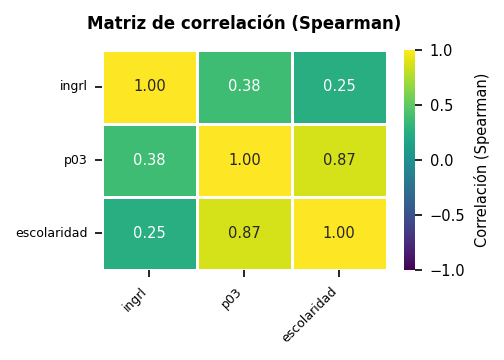

In [209]:
cols = ["ingrl", "p03", "escolaridad"]
var = df[cols].copy()
cor_matrix = var.corr(method="spearman")

# Graficar matriz de correlación
plt.figure(figsize=(3.5, 2.5), dpi=150)
ax =  sns.heatmap(
      cor_matrix,
      vmin=-1, vmax=1,
      cmap='viridis',
      annot=True,
      fmt='.2f',
      linewidths=0.5,
      annot_kws={'size': 7},
      cbar_kws={'label': 'Correlación (Spearman)'}
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=7)
cbar.set_label('Correlación (Spearman)', fontsize=7)

plt.title('Matriz de correlación (Spearman)', fontsize=8, fontweight='bold', pad=10)
plt.xticks(rotation=45, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)
plt.tight_layout()
plt.show()

### Análisis Univariante



**p07:** Asiste a clases

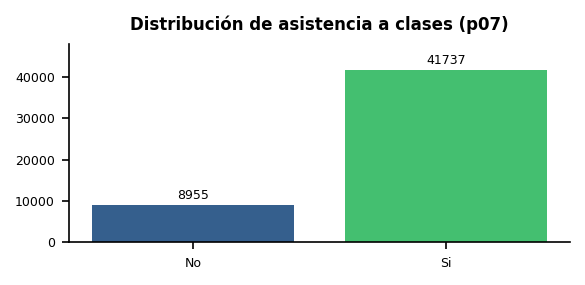

  Etiquetas  Conteo  Proporción (%)
0        No    8955           17.67
1        Si   41737           82.33


In [210]:
df["p07"] = df["p07"].astype(str)

# Etiquetas legibles
etiquetas_p07 = {"1": "Si", "2": "No"}
df["Etiquetas"] = df["p07"].map(etiquetas_p07)

# Resumen con conteo y proporción
resumen_p07 = (df.groupby("Etiquetas", dropna=False).size().reset_index(name="Conteo"))
resumen_p07["Proporción (%)"] = round((resumen_p07["Conteo"] / len(df)) * 100, 2)

# Gráfico de barras
fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
conteos = df["Etiquetas"].value_counts().sort_index()
colores = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.7, len(conteos)))
bars = ax.bar(conteos.index, conteos.values, color=colores)

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 0.02*max(conteos.values),
            f"{int(height)}", ha="center", va="bottom", fontsize=6)

ax.set_title("Distribución de asistencia a clases (p07)",
             fontsize=8, fontweight="bold", pad=7)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, max(conteos.values) * 1.15)

plt.tight_layout()
plt.show()

df = df.drop(columns=["Etiquetas"], errors="ignore")

print(resumen_p07)


**p10a** : Nivel de Intrucción

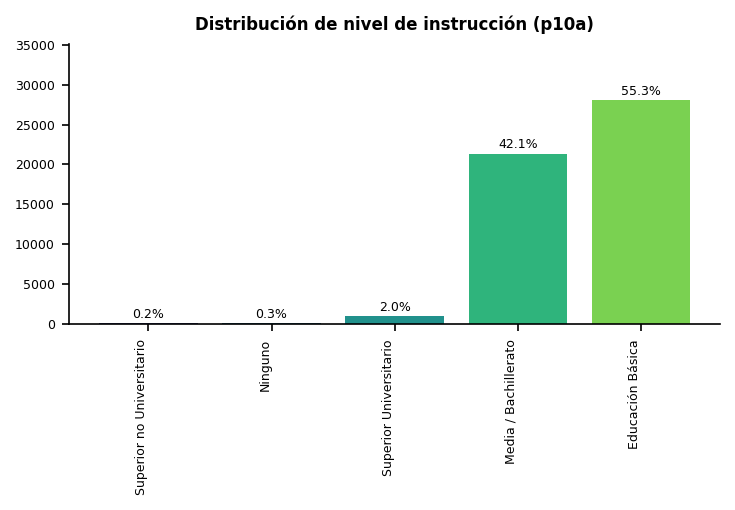

In [211]:
df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")

# Etiquetas del nivel de instrucción
etiquetas_p10a = {
    1: "Ninguno",
    2: "Centro de alfabetización",
    3: "Jardín de Infantes",
    4: "Primaria",
    5: "Educación Básica",
    6: "Secundaria",
    7: "Media / Bachillerato",
    8: "Superior no Universitario",
    9: "Superior Universitario",
    10: "Postgrado"
}

df["p10a_etiquetas"] = df["p10a"].map(etiquetas_p10a)

# Conteos ordenados por nivel (1 → 10)
conteos = (df["p10a_etiquetas"].value_counts().reindex(etiquetas_p10a.values(), fill_value=0))
conteos = conteos[conteos > 0].sort_values(ascending=True)
porcentajes = (conteos / conteos.sum()) * 100

fig, ax = plt.subplots(figsize=(5, 3.5), dpi=150)
colores = plt.colormaps.get_cmap("viridis")(np.linspace(0.2, 0.8, len(conteos)))
bars = ax.bar(conteos.index, conteos.values, color=colores)

for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.01 * max(conteos.values),
        f"{porcentajes.iloc[i]:.1f}%",
        ha="center", va="bottom", fontsize=6
    )

ax.set_title("Distribución de nivel de instrucción (p10a)",
             fontsize=8, fontweight="bold", pad=7)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
plt.xticks(rotation=90, ha="right")
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, max(conteos.values) * 1.25)
ax.grid(False)

plt.tight_layout()
plt.show()

df = df.drop(columns=["p10a_etiquetas"], errors="ignore")


**p04** : Relación de Parentesco

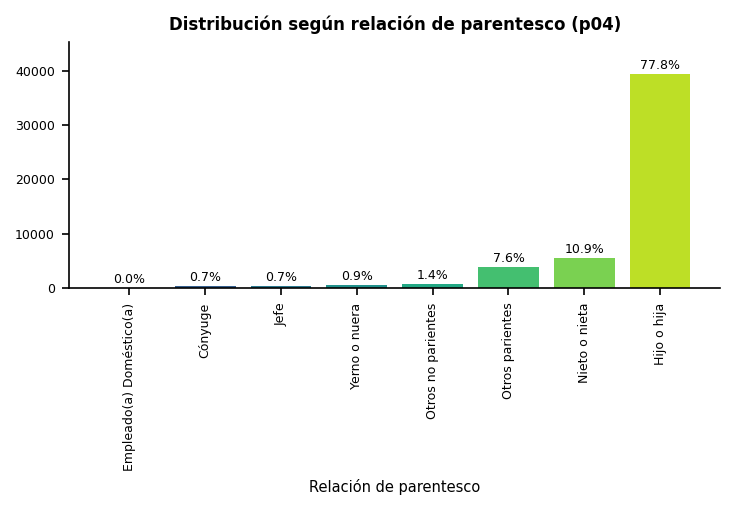

                 Parentesco  Conteo  Proporción (%)
0                      Jefe     356            0.70
1                   Cónyuge     343            0.68
2               Hijo o hija   39430           77.78
3             Yerno o nuera     474            0.94
4             Nieto o nieta    5526           10.90
5          Padres o suegros       0            0.00
6           Otros parientes    3861            7.62
7  Empleado(a) Doméstico(a)      10            0.02
8        Otros no parientes     692            1.37


In [212]:
df["p04"] = pd.to_numeric(df["p04"], errors="coerce")

# Etiquetas de la relación de parentesco
etiquetas_p04 = {
    1: "Jefe",
    2: "Cónyuge",
    3: "Hijo o hija",
    4: "Yerno o nuera",
    5: "Nieto o nieta",
    6: "Padres o suegros",
    7: "Otros parientes",
    8: "Empleado(a) Doméstico(a)",
    9: "Otros no parientes",
}

df["p04_etiquetas"] = df["p04"].map(etiquetas_p04)

resumen_p04 = (df["p04_etiquetas"].value_counts().reindex(etiquetas_p04.values(), fill_value=0).rename_axis("Parentesco").reset_index(name="Conteo"))
resumen_p04["Proporción (%)"] = (resumen_p04["Conteo"] / len(df) * 100).round(2)
plot_counts = resumen_p04[resumen_p04["Conteo"] > 0].copy()
plot_counts = plot_counts.sort_values("Conteo", ascending=True)


# Gráfico de barras
fig, ax = plt.subplots(figsize=(5, 3.5), dpi=150)
colores = plt.colormaps.get_cmap("viridis")(
    np.linspace(0.2, 0.9, len(plot_counts))
)
bars = ax.bar(plot_counts["Parentesco"], plot_counts["Conteo"], color=colores)

ymax = plot_counts["Conteo"].max()
for i, bar in enumerate(bars):
    h = bar.get_height()
    pct = plot_counts.iloc[i]["Proporción (%)"]
    ax.text(bar.get_x()+bar.get_width()/2, h + 0.01*ymax, f"{pct:.1f}%",
            ha="center", va="bottom", fontsize=6)

ax.set_title("Distribución según relación de parentesco (p04)",
             fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Relación de parentesco", fontsize=7)
ax.tick_params(axis='x', labelsize=6, rotation=90)
ax.tick_params(axis='y', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, ymax * 1.15)
ax.grid(False)

plt.tight_layout()
plt.show()

df = df.drop(columns=["p04_etiquetas"], errors="ignore")
print(resumen_p04)

**p03**: Edad


In [213]:
#Resumen estadístico de la variable continua
df['p03'].describe()

,p03
count,50692.000000
mean,15.453839
std,2.255997
min,12.000000
25%,14.000000
50%,15.000000
75%,17.000000
max,19.000000


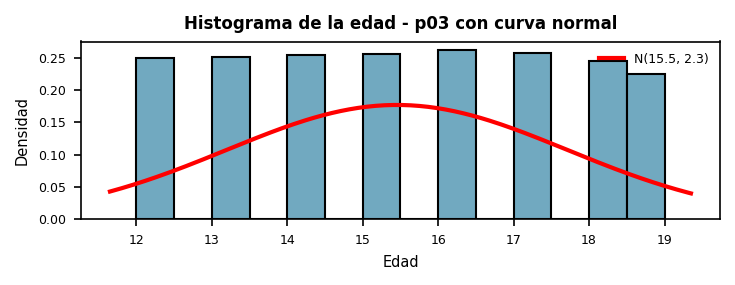

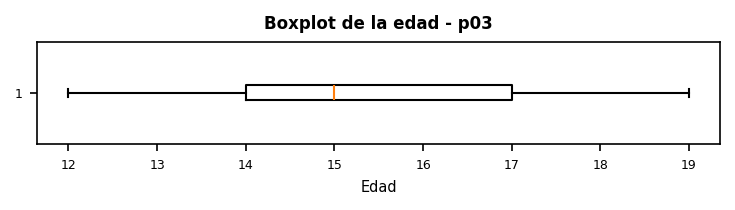

In [214]:
# Calcular parámetros de la distribución normal
data = df["p03"].dropna().astype(float)
mu, std = stats.norm.fit(data)

# --- Histograma con densidad ---
plt.figure(figsize=(5, 2), dpi=150)
sns.histplot(data=df, x='p03', bins=14,stat="density", edgecolor="black", color="#3585a6", alpha=0.7)

# --- Curva de distribución normal ---
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 200)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'r', linewidth=2, label=f'N({mu:.1f}, {std:.1f})')
plt.title("Histograma de la edad - p03 con curva normal", fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Edad", fontsize=7)
plt.ylabel("Densidad", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.legend(fontsize=6, loc="upper right", frameon=False)
plt.tight_layout()
plt.show()

# --- Boxplot horizontal ---
plt.figure(figsize=(5, 1.5), dpi=150)
plt.boxplot(df["p03"].dropna(), vert=False)
plt.title("Boxplot de la edad - p03", fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Edad", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.tight_layout()
plt.show()

**Escolaridad**

In [215]:
#Resumen estadístico de la variable continua
df['escolaridad'].describe()

,escolaridad
count,50692.000000
mean,10.044899
std,2.310109
min,0.000000
25%,8.000000
50%,10.000000
75%,12.000000
max,17.000000


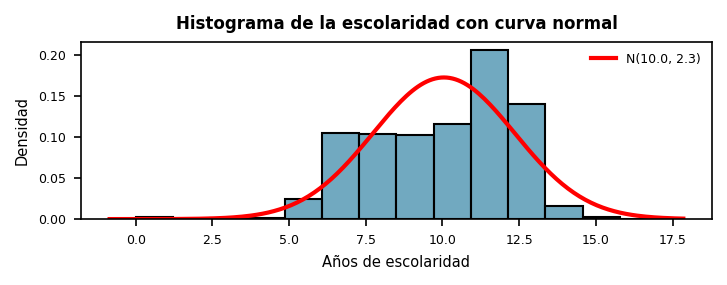

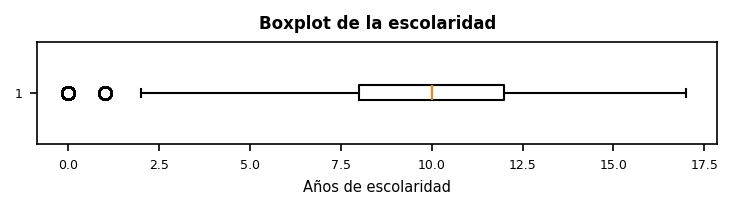

In [216]:
# Calcular parámetros de la distribución normal
data = df["escolaridad"].dropna().astype(float)
mu, std = stats.norm.fit(data)

# --- Histograma con densidad ---
plt.figure(figsize=(5, 2), dpi=150)
sns.histplot(data=df, x='escolaridad', bins=14,stat="density", edgecolor="black", color="#3585a6", alpha=0.7)

# --- Curva de distribución normal ---
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 200)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'r', linewidth=2, label=f'N({mu:.1f}, {std:.1f})')
plt.title("Histograma de la escolaridad con curva normal", fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Años de escolaridad", fontsize=7)
plt.ylabel("Densidad", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.legend(fontsize=6, loc="upper right", frameon=False)
plt.tight_layout()
plt.show()

# --- Boxplot horizontal ---
plt.figure(figsize=(5, 1.5), dpi=150)
plt.boxplot(df["escolaridad"].dropna(), vert=False)
plt.title("Boxplot de la escolaridad", fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Años de escolaridad", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.tight_layout()
plt.show()

**ingrl**: Ingreso laboral

La distribución de la variable ingrl - Ingreso laboral no sigue una distribución normal y se distribuye asimétricamente a la derecha.

Dado que se trato previamente los códigos especiales, se puede observar que gran parte de la población objetivo perciben ingresos muy bajos, debido a que las barras se concentran muy cerca del 0 USD, sin embargo, a medida que incrementa el valor del ingreso la frecuencia disminuye rápidamente.

Por la forma de curva y el gráfico de cajas y bigotes (boxplot), se deben identificar los valores extremos para dar el respectivo tratamiento a los outliers.

In [217]:
#Resumen estadístico de la variable continua
df['ingrl'].describe()

,ingrl
count,34766.000000
mean,19.753897
std,85.809854
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,2500.000000


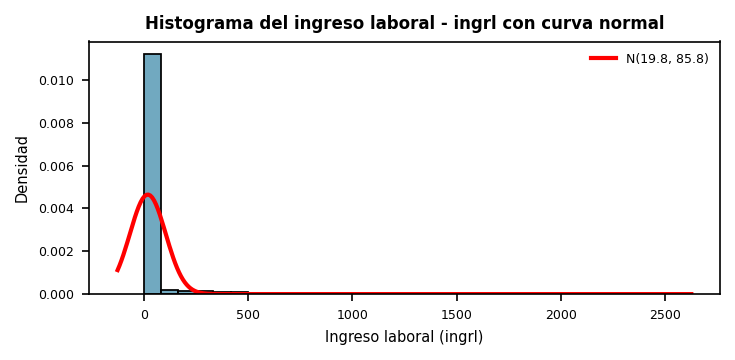

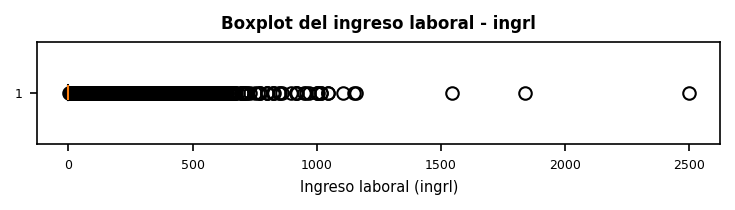

In [218]:
# Calcular media y desviación estándar para la distribución normal
data = df["ingrl"].dropna().astype(float)
mu, std = stats.norm.fit(data)

# Histograma con densidad
plt.figure(figsize=(5,2.5), dpi=150)
sns.histplot(x=data, bins=30,  # puedes ajustar el número de bins según dispersión
             stat="density", edgecolor="black", color="#3585a6", alpha=0.7)

# Curva de distribución normal
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 300)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'r', linewidth=2, label=f'N({mu:.1f}, {std:.1f})')
plt.title("Histograma del ingreso laboral - ingrl con curva normal",
          fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Ingreso laboral (ingrl)", fontsize=7)
plt.ylabel("Densidad", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.legend(fontsize=6, loc="upper right", frameon=False)
plt.tight_layout()
plt.show()

# Boxplot horizontal
plt.figure(figsize=(5, 1.5), dpi=150)
plt.boxplot(df["ingrl"].dropna(), vert=False)
plt.title("Boxplot del ingreso laboral - ingrl", fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Ingreso laboral (ingrl)", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.tight_layout()
plt.show()

*Primera fase:* Se puede observar que la distribución esta fuertemente sesgada a la derecha y con outliers extremos, pero tambien hay valores faltantes que deben ser tratados.

Primero se va a realizar la limpieza y tratamiento de los valores faltantes en ingreso laboral, los valores faltantes se van a imputar con la mediana por subgrupo. Esta decisión se fundamenta en que la mediana es una medida robusta frente a valores extremos y refleja mejor la tendencia central de distribuciones asimétricas como los ingresos. La imputación se realizó segmentando la población en subgrupos definidos por variables como: edad, nivel de instrucción y años de escolaridad, de modo que cada individuo recibiera un valor imputado coherente con su contexto.


0


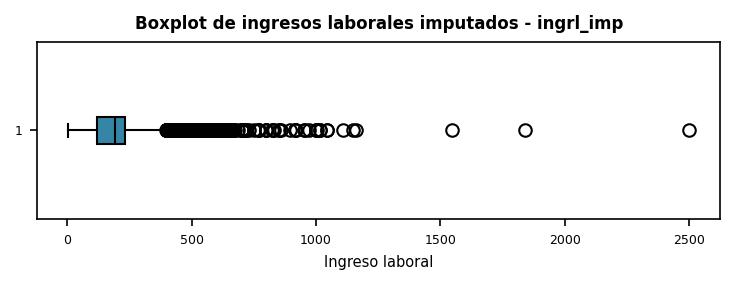

In [219]:
for c in ["p03", "p10a", "escolaridad", "ingrl"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Mediana grupal por (edad, nivel de instrucción, escolaridad)
df.loc[df["ingrl"] == 0, "ingrl"] = np.nan
medianas_grp = (
    df.groupby(["p03","p10a", "escolaridad"], dropna=False)["ingrl"]
      .transform("median"))

# Imputación
df["ingrl_imp"] = df["ingrl"].fillna(medianas_grp)
mediana_global = df["ingrl"].median(skipna=True)
df["ingrl_imp"] = df["ingrl_imp"].fillna(mediana_global)

# Verificación de nulos
print(df["ingrl_imp"].isna().sum())

# Boxplot horizontal de ingresos imputados
plt.figure(figsize=(5, 2), dpi=150)
bp = plt.boxplot(
    df["ingrl_imp"].dropna(),
    vert=False,
    patch_artist=True,
    boxprops=dict(facecolor="#3585a6", edgecolor="black"),
    medianprops=dict(color="black"),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black")
)
plt.title("Boxplot de ingresos laborales imputados - ingrl_imp",
          fontsize=8, fontweight="bold", pad=6)
plt.xlabel("Ingreso laboral", fontsize=7)
plt.tick_params(axis='both', labelsize=6)
plt.tight_layout()
plt.show()


### Detección y tratamiento de Outliers

#### Método Clásico

A través del método clásico del rango intercuartílico (RIC) se realizó la detección de los outliers y se determinó que todos los valores superiores a 981 USD son atípicos en la población objetivo.

In [220]:
# Cálculo de cuartiles e IQR
Q1 = np.nanpercentile(df["ingrl_imp"], 25)
Q3 = np.nanpercentile(df["ingrl_imp"], 75)
IQR = Q3 - Q1

# Límites para detectar atípicos
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
lower_extreme = Q1 - 3 * IQR
upper_extreme = Q3 + 3 * IQR

# Mostrar resultados
print(f"Valores atípicos moderados de ingreso laboral (ingrl_imp): [{lower_extreme:.2f}, {lower_bound:.2f}] o [{upper_bound:.2f}, {upper_extreme:.2f}]")
print(f"Valores atípicos extremos de ingreso laboral (ingrl_imp) son superiores a {upper_extreme:.2f}")


Valores atípicos moderados de ingreso laboral (ingrl_imp): [-210.00, -45.00] o [395.00, 560.00]
Valores atípicos extremos de ingreso laboral (ingrl_imp) son superiores a 560.00


#### Método Isolation Forest Multivariado

A través de esta técnica es posible identificar los outliers, pero mediate al análisis simultáneo de las variables que se encuentran altamente correlacionadas y detecta patrones atípicos pero combinados. Adecuado cuando los datos no están distibuidos normalmente y utilizado para manejar estadísticas a nivel nacional, debidoa que admite un conjunto de datos más limpio y por tanto permite un análisis más riguroso y los modelos predictivos son más estables y confiables.


In [221]:
for c in ["ingrl_imp", "p03", "escolaridad"]:
    df[c] = pd.to_numeric(df[c], errors="coerce")
vars_iso = ["ingrl_imp", "p03", "escolaridad"]

# Estandarización
scaler = StandardScaler()
X = scaler.fit_transform(df[vars_iso].values)

# Isolation Forest (mismo número de árboles)
iso = IsolationForest(n_estimators=100, random_state=42, contamination="auto")
iso.fit(X)
scores = -iso.score_samples(X)

# Umbral por cuantil (ej.: top 1% como en tu código con 0.99)
umbral = np.nanquantile(scores, 0.99)

# Etiquetado
df["outlier_iso_multi"] = np.where(scores > umbral, "Outlier", "Normal")

print(df["outlier_iso_multi"].value_counts(dropna=False))


outlier_iso_multi
Normal     50185
Outlier      507
Name: count, dtype: int64


El modelo Isolation Forest identificó 851 registros como outliers multivariantes, es decir, casos que corresponden a personas con patrones de edad, nivel de instrucción o ingresos laborales significativamente distintos al resto de la población de estudio.
Estos registros representan un subconjunto pequeño respecto al total de tu muestra.


In [222]:
# Resumen por grupo (Outlier vs Normal)
resumen = (
    df.groupby("outlier_iso_multi", dropna=False)
      .agg(
          n=("ingrl_imp", "size"),
          edad_promedio=("p03", lambda x: x.mean(skipna=True)),
          ingreso_promedio=("ingrl_imp", lambda x: x.mean(skipna=True)),
          años_escolaridad_promedio=("escolaridad", lambda x: x.mean(skipna=True))
      )
      .reset_index()
)
print(resumen)


  outlier_iso_multi      n  edad_promedio  ingreso_promedio  \
0            Normal  50185      15.436086        189.878898   
1           Outlier    507      17.211045        379.299803   

   años_escolaridad_promedio  
0                  10.082415  
1                   6.331361  


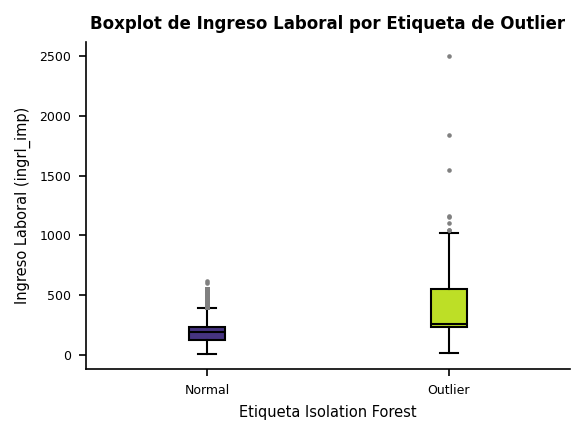

In [223]:
# Boxplot de ingrl_imp por etiqueta
cmap = plt.colormaps.get_cmap("viridis")
col_map = {"Normal": cmap(0.15), "Outlier": cmap(0.9)}

data_box = [
    df.loc[df["outlier_iso_multi"]=="Normal",  "ingrl_imp"].dropna(),
    df.loc[df["outlier_iso_multi"]=="Outlier", "ingrl_imp"].dropna()
]
labels = ["Normal", "Outlier"]
colors = [col_map[l] for l in labels]

fig, ax = plt.subplots(figsize=(4, 3), dpi=150)
box = ax.boxplot(
    data_box,
    tick_labels=labels,
    patch_artist=True,
    medianprops=dict(color="black"),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black"),
    flierprops=dict(marker='o', markersize=1.2, markerfacecolor='gray', markeredgecolor='gray')
)
for patch, color in zip(box["boxes"], colors):
    patch.set_facecolor(color)
    patch.set_edgecolor("black")

ax.set_title("Boxplot de Ingreso Laboral por Etiqueta de Outlier", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Etiqueta Isolation Forest", fontsize=7)
ax.set_ylabel("Ingreso Laboral (ingrl_imp)", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()


**Winsorización**

Para reducir la influencia de los outliers de la variable ingreso laboral (ingrl), con lo cuál se van a reemplazar los valores extremos con los percentiles 5 y 95 como puntos de corte. De esta manera, todos los valores inferioes al percentil 5 se los iba a sustituir por dicho percentil, mientras que to los valores superiores al percentil 95 se reemplazan por el valor correspondiente del percentil. De esta manera, se mantiene el tamaño de la muestra pero se reduce el la influencia de estos valores y conserva la distribución de los datos.

La elección de estos percentiles responde a un criterio metodológico intermedio: es lo suficientemente amplio como para conservar la mayor parte de la variabilidad real de los datos, pero lo bastante restrictivo como para reducir el impacto de valores atípicos extremos.

In [224]:
# Winsorización al 5% y 95% ---
df["ingrl_imp"] = pd.to_numeric(df["ingrl_imp"], errors="coerce")
p5  = np.nanpercentile(df["ingrl_imp"], 5)
p95 = np.nanpercentile(df["ingrl_imp"], 95)

# Equivalente a pmin(pmax(x, p5), p95)
df["ingrl_wins"] = np.clip(df["ingrl_imp"], p5, p95)
print(f"P5 = {p5:.2f} | P95 = {p95:.2f}")


P5 = 100.00 | P95 = 275.00


La winsorización aplicada al ingreso laboral (ingrl) entre los percentiles 5 y 95 permitió reducir drásticamente los valores extremos sin alterar la tendencia central.

El máximo se redujo de 2.500 USD a 275 USD, evidenciando el tratamiento de valores atípicos extremos. Esta transformación mejora la estabilidad de las estadísticas descriptivas y de los modelos posteriores en la variable, ya que disminuye la influencia desproporcionada de outliers en los cálculos.

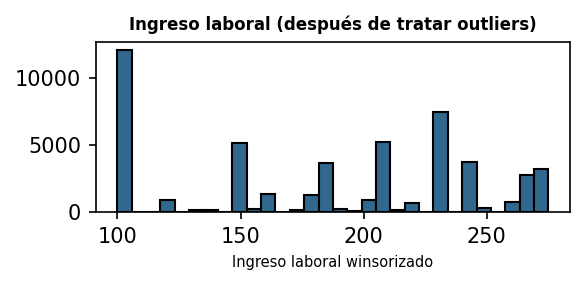

In [225]:
# Histograma de ingrl_wins
plt.figure(figsize=(4, 2), dpi=150)
plt.hist(df["ingrl_wins"], bins=30, edgecolor="black", color="#31688E")
plt.title("Ingreso laboral (después de tratar outliers)", fontsize=8, fontweight="bold", pad=6)
ax.tick_params(axis='x', labelsize=4)
ax.tick_params(axis='y', labelsize=3)
plt.xlabel("Ingreso laboral winsorizado", fontsize=7)
ax.spines[['top', 'left']].set_visible(False)
plt.tight_layout()
plt.show()

In [226]:
outliers = df[df["outlier_iso_multi"] == "Outlier"].copy()

# Resumen numérico
summary_outliers_num = outliers.select_dtypes(include=[np.number]).describe()
summary_outliers_cat = outliers.select_dtypes(exclude=[np.number]).describe()

def iqr(x):
    return x.quantile(0.75) - x.quantile(0.25)

tabla = (
    df[["ingrl", "ingrl_wins"]]
      .agg(["mean", "median", "min", "max", iqr])
      .rename(index={"mean":"Media","median":"Mediana","min":"Mínimo","max":"Máximo","iqr":"IQR"})
      .round(2)
)

descriptivos_comparacion = (
    tabla
    .reset_index()
    .rename(columns={"index":"Variable: ingrl", "ingrl":"Original", "ingrl_wins":"Winsorizado"})
)
print(descriptivos_comparacion)

  Variable: ingrl  Original  Winsorizado
0           Media    266.81       184.43
1         Mediana    230.00       193.00
2          Mínimo      4.00       100.00
3          Máximo   2500.00       275.00
4             IQR    280.00       110.00


### Análisis Bivariante

**Porcentaje de deserción educativa por área**

Los resultados indican una mayor concentración de casos de deserción en el sector rural con alrededor del 20%, en comparación con el área urbana con el 12%.

Esta diferencia evidencia una vez más que la ubicación geográfica incide en la permanencia educativa. Esto esta relacionado con la desigualdad en el acceso a centros educativos, infraestructura y oportunidades socioeconómicas.

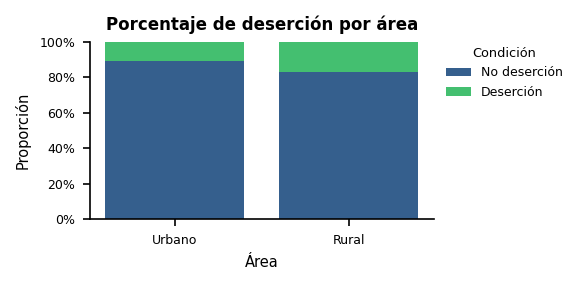


Tabla cruzada:
desercion_    No deserción      Deserción
area_                                    
Urbano      31506 (89.01%)  3890 (10.99%)
Rural       12700 (83.03%)  2596 (16.97%)


In [227]:
map_area = {1:"Urbano", 2:"Rural", "1":"Urbano", "2":"Rural"}
df["area_"] = df["area"].map(map_area)
map_desercion = {0:"No deserción", 1:"Deserción", "0":"No deserción", "1":"Deserción"}
df["desercion_"] = df["desercion"].map(map_desercion)

# Tabla y proporciones
tabla = pd.crosstab(df["desercion_"], df["area_"])
prop  = tabla / tabla.sum(axis=0)
df_area = prop.reset_index().melt(id_vars="desercion_",
                                  var_name="Área", value_name="Proporción")

# Gráfico apilado
fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
areas = ["Urbano","Rural"]
bottom = np.zeros(len(areas))
cats = ["No deserción","Deserción"]
colors = plt.colormaps.get_cmap("viridis")(np.linspace(0.3,0.7,len(cats)))
for c, col in zip(cats, colors):
    vals = [df_area[(df_area["Área"]==a)&(df_area["desercion_"]==c)]["Proporción"].values[0]
            if not df_area[(df_area["Área"]==a)&(df_area["desercion_"]==c)].empty else 0
            for a in areas]
    ax.bar(areas, vals, bottom=bottom, label=c, color=col)
    bottom += vals

ax.set_title("Porcentaje de deserción por área", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Área", fontsize=7)
ax.set_ylabel("Proporción", fontsize=7)
ax.set_ylim(0,1)
ax.tick_params(axis='both', labelsize=6)
ax.yaxis.set_major_formatter(lambda x, pos: f"{x*100:.0f}%")
ax.legend(title="Condición", fontsize=6, title_fontsize=6.2, frameon=False,
          loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.show()

tabla_conteo = pd.crosstab(df["area_"], df["desercion_"])
tabla_fila = pd.crosstab(df["area_"], df["desercion_"], normalize="index") * 100

tabla_combinada = tabla_conteo.astype(str) + " (" + tabla_fila.round(2).astype(str) + "%)"
df = df.drop(columns=["area_","desercion_"], errors="ignore")

print("\nTabla cruzada:")
print(tabla_combinada)

**Porcentaje de deserción educativa por sexo**

Los resultados evidencias que la deserción educativa por sexo, tanto para hombres y mujeres es alrededor del 14%, evidenciando que la brecha por sexo es mínimsa.

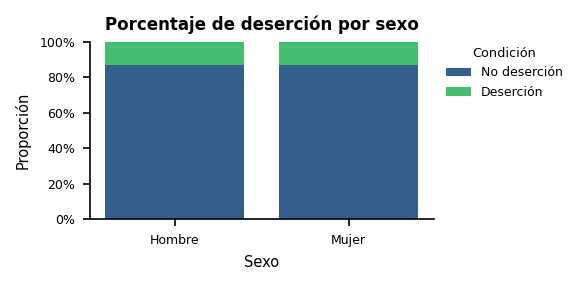


Tabla cruzada:
desercion_    No deserción      Deserción
sexo_                                    
Hombre      22527 (87.17%)  3315 (12.83%)
Mujer       21679 (87.24%)  3171 (12.76%)


In [228]:
map_p02 = {1: "Hombre", 2: "Mujer", "1": "Hombre", "2": "Mujer"}
df["sexo_"] = df["p02"].map(map_p02)

map_desercion = {0: "No deserción", 1: "Deserción", "0": "No deserción", "1": "Deserción"}
df["desercion_"] = df["desercion"].map(map_desercion)

# Tabla y proporciones
tabla = pd.crosstab(df["desercion_"], df["sexo_"])
prop = tabla / tabla.sum(axis=0)
df_p02 = prop.reset_index().melt(id_vars="desercion_",
                                 var_name="Sexo", value_name="Proporción")

# Gráfico apilado
fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
sexos = ["Hombre", "Mujer"]
bottom = np.zeros(len(sexos))
cats = ["No deserción", "Deserción"]
colors = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.7, len(cats)))

for c, col in zip(cats, colors):
    vals = [df_p02[(df_p02["Sexo"] == s) & (df_p02["desercion_"] == c)]["Proporción"].values[0]
            if not df_p02[(df_p02["Sexo"] == s) & (df_p02["desercion_"] == c)].empty else 0
            for s in sexos]
    ax.bar(sexos, vals, bottom=bottom, label=c, color=col)
    bottom += vals

# Configuración del gráfico
ax.set_title("Porcentaje de deserción por sexo", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Sexo", fontsize=7)
ax.set_ylabel("Proporción", fontsize=7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', labelsize=6)
ax.yaxis.set_major_formatter(lambda x, pos: f"{x*100:.0f}%")
ax.legend(title="Condición", fontsize=6, title_fontsize=6.2, frameon=False,
          loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

# Tablas cruzadas
tabla_conteo = pd.crosstab(df["sexo_"], df["desercion_"])
tabla_fila = pd.crosstab(df["sexo_"], df["desercion_"], normalize="index") * 100

# Combinar conteos y porcentajes
tabla_combinada = tabla_conteo.astype(str) + " (" + tabla_fila.round(2).astype(str) + "%)"
df = df.drop(columns=["sexo_", "desercion_"], errors="ignore")

print("\nTabla cruzada:")
print(tabla_combinada)

**Edad según la variable deserción**

La probabilidad de deserción educativa aumenta a medida que aumenta la edad de los estudiantes pero dentro del rango escolar de los niveles obligatorios, y sucede especificamente al aproximarse a la etapa de transición hacia la búsqueda de trabajo o la continuidad en la educación superior.”

Esto coincide con estudios del presentados por el Instituto Nacional de Estadísticas y Censos en el 2023 y de la UNESCO, que indican que los adolescentes de entre 16 y 20 años son los más propensos a abandonar los estudios por motivos económicos, laborales o familiares.

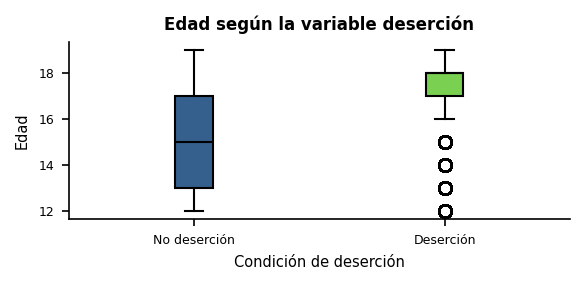

In [229]:
map_desercion = {0: "No deserción", 1: "Deserción", "0": "No deserción", "1": "Deserción"}
df["desercion_lbl"] = df["desercion"].map(map_desercion)

data = [
    df.loc[df["desercion_lbl"]=="No deserción", "p03"].dropna(),
    df.loc[df["desercion_lbl"]=="Deserción", "p03"].dropna()
]

colores = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.8, len(data)))

fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
box = ax.boxplot(
    data,
    tick_labels=["No deserción", "Deserción"],
    patch_artist=True,
    medianprops=dict(color="black", linewidth=1),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black")
)

for patch, color in zip(box["boxes"], colores):
    patch.set_facecolor(color)
    patch.set_edgecolor("black")

ax.set_title("Edad según la variable deserción", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Condición de deserción", fontsize=7)
ax.set_ylabel("Edad", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

df = df.drop(columns=["desercion_lbl"], errors="ignore")

**Relación de parentesco según la variable deserción**

En términos generales, se observa que las tasas de deserción varían significativamente entre los distintos miembros del hogar, lo que evidencia una relación entre la posición dentro del núcleo familiar y la probabilidad de abandonar el sistema educativo.

Los resultados muestran que los hijos e hijas constituyen el grupo con mayor permanencia en el sistema educativo,lo cual es coherente con su edad escolar y con el apoyo directo del núcleo familiar. En contraste, los jefes de hogar registran un 26.9% de deserción, evidenciando una generación con niveles educativos más bajos que la de sus hijos. Minetras que, las parejas, yernos y nueras reflejando que la formación de un hogar propio y las responsabilidades familiares o laborales se asocian a un mayor abandono de los estudios.

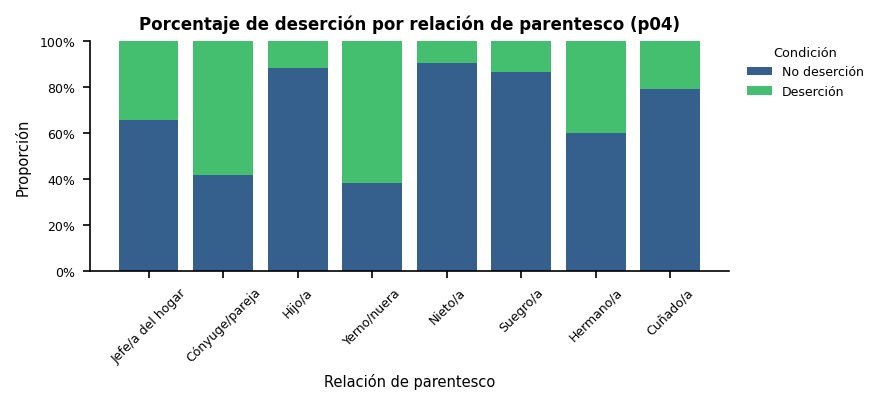


Tabla cruzada:
desercion_          No deserción      Deserción
p04_                                           
Cuñado/a             546 (78.9%)    146 (21.1%)
Cónyuge/pareja      143 (41.69%)   200 (58.31%)
Hermano/a              6 (60.0%)      4 (40.0%)
Hijo/a            34771 (88.18%)  4659 (11.82%)
Jefe/a del hogar    234 (65.73%)   122 (34.27%)
Nieto/a            4988 (90.26%)    538 (9.74%)
Suegro/a            3336 (86.4%)    525 (13.6%)
Yerno/nuera          182 (38.4%)    292 (61.6%)


In [230]:
map_p04 = {
    1: "Jefe/a del hogar",
    2: "Cónyuge/pareja",
    3: "Hijo/a",
    4: "Yerno/nuera",
    5: "Nieto/a",
    6: "Padre/madre",
    7: "Suegro/a",
    8: "Hermano/a",
    9: "Cuñado/a",
    10: "Otro pariente",
    11: "No pariente",
    12: "Trabajador/a del hogar",
    13: "Pensionista/Huésped",
    "1": "Jefe/a del hogar",
    "2": "Cónyuge/pareja",
    "3": "Hijo/a",
    "4": "Yerno/nuera",
    "5": "Nieto/a",
    "6": "Padre/madre",
    "7": "Suegro/a",
    "8": "Hermano/a",
    "9": "Cuñado/a",
    "10": "Otro pariente",
    "11": "No pariente",
    "12": "Trabajador/a del hogar",
    "13": "Pensionista/Huésped"
}

df["p04_"] = df["p04"].map(map_p04)

map_desercion = {0: "No deserción", 1: "Deserción", "0": "No deserción", "1": "Deserción"}
df["desercion_"] = df["desercion"].map(map_desercion)

# Tabla y proporciones
tabla = pd.crosstab(df["desercion_"], df["p04_"])
prop = tabla / tabla.sum(axis=0)
df_p04 = prop.reset_index().melt(id_vars="desercion_",
                                 var_name="Parentesco", value_name="Proporción")

orden_parentesco = [
    "Jefe/a del hogar", "Cónyuge/pareja", "Hijo/a", "Yerno/nuera", "Nieto/a",
    "Padre/madre", "Suegro/a", "Hermano/a", "Cuñado/a",
    "Otro pariente", "No pariente", "Trabajador/a del hogar", "Pensionista/Huésped"
]
categorias_x = [c for c in orden_parentesco if c in df_p04["Parentesco"].unique()]

# Gráfico apilado
fig, ax = plt.subplots(figsize=(6, 2.8), dpi=150)
bottom = np.zeros(len(categorias_x))
cats = ["No deserción", "Deserción"]
colors = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.7, len(cats)))

for c, col in zip(cats, colors):
    vals = [df_p04[(df_p04["Parentesco"] == p) & (df_p04["desercion_"] == c)]["Proporción"].values[0]
            if not df_p04[(df_p04["Parentesco"] == p) & (df_p04["desercion_"] == c)].empty else 0
            for p in categorias_x]
    ax.bar(categorias_x, vals, bottom=bottom, label=c, color=col)
    bottom += vals

ax.set_title("Porcentaje de deserción por relación de parentesco (p04)", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Relación de parentesco", fontsize=7)
ax.set_ylabel("Proporción", fontsize=7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', labelsize=6)
ax.tick_params(axis='x', labelrotation=45)
ax.yaxis.set_major_formatter(lambda x, pos: f"{x*100:.0f}%")
ax.legend(title="Condición", fontsize=6, title_fontsize=6.2, frameon=False,
          loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

# Tablas cruzadas
tabla_conteo = pd.crosstab(df["p04_"], df["desercion_"])
tabla_fila = pd.crosstab(df["p04_"], df["desercion_"], normalize="index") * 100

tabla_combinada = tabla_conteo.astype(str) + " (" + tabla_fila.round(2).astype(str) + "%)"
df = df.drop(columns=["p04_", "desercion_"], errors="ignore")

print("\nTabla cruzada:")
print(tabla_combinada)

**Ingreso laboral según la variable deserción**

En ambos casos, la distribución es altamente asimétrica a la derecha, lo cual es habitual en ingresos laborales debido a que pocas personas concentran ingresos altos, mientras que el resto percibe montos bajos, y concentran gran parte de la población.

Los valores atípicos (outliers) reflejan personas con ingresos laborales muy superiores al promedio, que no afectan significativamente la tendencia general debido al uso de la mediana.

Se puede observar que la deserción educativa no garantiza un mejor ingreso laboral; por el contrario, quienes permanecen en el sistema educativo tienden a alcanzar mejores niveles de ingreso, incluso en etapas iniciales del mercado laboral, a diferencia de quienes en su momento abandonaron el sistema.

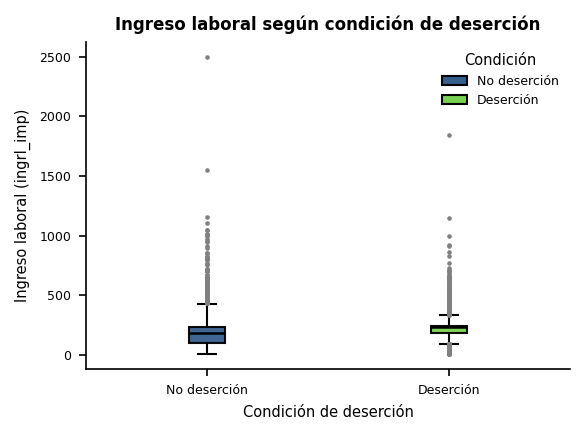

In [231]:
map_desercion = {0:"No deserción", 1:"Deserción", "0":"No deserción", "1":"Deserción"}
df["desercion_lbl"] = df["desercion"].map(map_desercion)

df["ingrl_imp"] = pd.to_numeric(df["ingrl_imp"], errors="coerce")

data = [
    df.loc[df["desercion_lbl"] == "No deserción", "ingrl_imp"].dropna(),
    df.loc[df["desercion_lbl"] == "Deserción", "ingrl_imp"].dropna()
]

cmap = plt.colormaps.get_cmap("viridis")
colores = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.8, len(data)))

fig, ax = plt.subplots(figsize=(4, 3), dpi=150)
box = ax.boxplot(
    data,
    tick_labels=["No deserción", "Deserción"],
    patch_artist=True,
    medianprops=dict(color="black", linewidth=1.2),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black"),
    flierprops=dict(marker='o', markersize=1.2, markerfacecolor='gray', markeredgecolor='gray')
)

for patch, color in zip(box["boxes"], colores):
    patch.set_facecolor(color)
    patch.set_edgecolor("black")
    patch.set_alpha(0.95)

handles = [
    Patch(facecolor=colores[0], edgecolor="black", label="No deserción"),
    Patch(facecolor=colores[1], edgecolor="black", label="Deserción")
]
ax.legend(handles=handles, title="Condición", fontsize=6, title_fontsize=7,
          frameon=False, loc="upper right")
ax.set_title("Ingreso laboral según condición de deserción", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Condición de deserción", fontsize=7)
ax.set_ylabel("Ingreso laboral (ingrl_imp)", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

df = df.drop(columns=["desercion_lbl"], errors="ignore")

**Porcentaje de deserción educativa según la variable desempleo**

Las personas que han abandonado sus estudios presentan una mayor vulnerabilidad frente al desempleo, lo que refuerza el carácter estructural de la educación como factor determinante de la empleabilidad y de las condiciones económicas del hogar.
En consecuencia, la deserción no solo constituye una pérdida de oportunidades educativas, sino que impacta directamente en la capacidad de acceso al trabajo y en la estabilidad laboral futura.

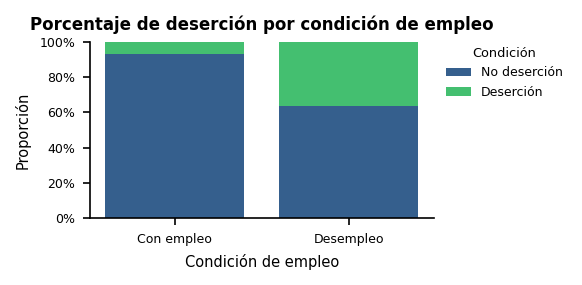


Tabla cruzada:
desercion_   No deserción      Deserción
desempleo_                              
Con empleo  37856 (93.0%)    2849 (7.0%)
Desempleo   6350 (63.58%)  3637 (36.42%)


In [232]:
map_desempleo = {0:"Con empleo", 1:"Desempleo", "0":"Con empleo", "1":"Desempleo"}
df["desempleo_"] = df["desempleo"].map(map_desempleo)

map_desercion = {0:"No deserción", 1:"Deserción", "0":"No deserción", "1":"Deserción"}
df["desercion_"] = df["desercion"].map(map_desercion)

# Tabla de proporciones
tabla = pd.crosstab(df["desercion_"], df["desempleo_"])
prop  = tabla / tabla.sum(axis=0)
df_emp = prop.reset_index().melt(id_vars="desercion_",
                                 var_name="Empleo", value_name="Proporción")

# Gráfico apilado
fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
estados = ["Con empleo","Desempleo"]
bottom = np.zeros(len(estados))
cats = ["No deserción","Deserción"]
colors = plt.colormaps.get_cmap("viridis")(np.linspace(0.3,0.7,len(cats)))

for c, col in zip(cats, colors):
    vals = [df_emp[(df_emp["Empleo"]==e)&(df_emp["desercion_"]==c)]["Proporción"].values[0]
            if not df_emp[(df_emp["Empleo"]==e)&(df_emp["desercion_"]==c)].empty else 0
            for e in estados]
    ax.bar(estados, vals, bottom=bottom, label=c, color=col)
    bottom += vals

ax.set_title("Porcentaje de deserción por condición de empleo", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Condición de empleo", fontsize=7)
ax.set_ylabel("Proporción", fontsize=7)
ax.set_ylim(0,1)
ax.tick_params(axis='both', labelsize=6)
ax.yaxis.set_major_formatter(lambda x, pos: f"{x*100:.0f}%")
ax.legend(title="Condición", fontsize=6, title_fontsize=6.2, frameon=False,
          loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.show()

# Tablas cruzada
tabla_conteo = pd.crosstab(df["desempleo_"], df["desercion_"])
tabla_fila = pd.crosstab(df["desempleo_"], df["desercion_"], normalize="index") * 100

tabla_combinada = tabla_conteo.astype(str) + " (" + tabla_fila.round(2).astype(str) + "%)"
df = df.drop(columns=["desempleo_","desercion_"], errors="ignore")

print("\nTabla cruzada:")
print(tabla_combinada)

**Escolaridad según la variable deserción**

Se observa que los individuos que no han desertado presentan una mediana de escolaridad de aproximadamente 12 años, equivalente al nivel de bachillerato completo, mientras que el grupo de desertores muestra una mediana cercana a los 11 años, lo cual evidencia un menor logro educativo.

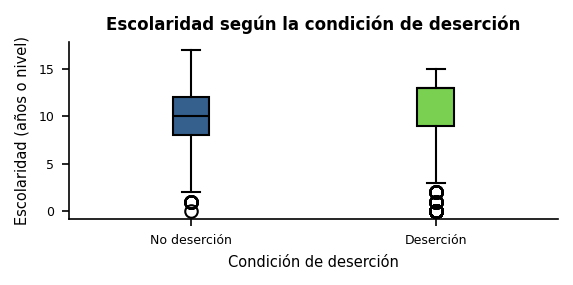

In [233]:
map_desercion = {0: "No deserción", 1: "Deserción", "0": "No deserción", "1": "Deserción"}
df["desercion_lbl"] = df["desercion"].map(map_desercion)

data = [
    df.loc[df["desercion_lbl"] == "No deserción", "escolaridad"].dropna(),
    df.loc[df["desercion_lbl"] == "Deserción", "escolaridad"].dropna()
]
colores = plt.colormaps.get_cmap("viridis")(np.linspace(0.3, 0.8, len(data)))

# Gráfico de cajas
fig, ax = plt.subplots(figsize=(4, 2), dpi=150)
box = ax.boxplot(
    data,
    tick_labels=["No deserción", "Deserción"],
    patch_artist=True,
    medianprops=dict(color="black", linewidth=1),
    whiskerprops=dict(color="black"),
    capprops=dict(color="black")
)

for patch, color in zip(box["boxes"], colores):
    patch.set_facecolor(color)
    patch.set_edgecolor("black")

# Gráfico
ax.set_title("Escolaridad según la condición de deserción", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Condición de deserción", fontsize=7)
ax.set_ylabel("Escolaridad (años o nivel)", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

df = df.drop(columns=["desercion_lbl"], errors="ignore")

**Porcentaje de deserción educativa según el nivel de instrucción**

En los niveles iniciales que coresponden a las categorías “Ninguno” y “Centro de alfabetización”, la deserción es casi total, lo cual es esperable porque estos grupos reflejan personas que nunca ingresaron o abandonaron tempranamente la educación formal.

Por otro lado, en los niveles superior no universitario, universitario junto a los niveles de posgrado, supera el 90% de quienes no se hhan visto afectados por el fenóomeno de la deserción, mostrando una clara consolidación de la permanencia.

Sin embargo, los mayores niveles de abandono en el sistema educativo se concentran en la Educación Básica y Media/Bachillerato, lo que refleja el momento en que los jóvenes enfrentan mayores presiones económicas o sociales que pueden llevarlos a interrumpir sus estudios, y en algunos casos coinciden con la etapa de transición entre la educación obligatoria y superior, o la inserción laboral.

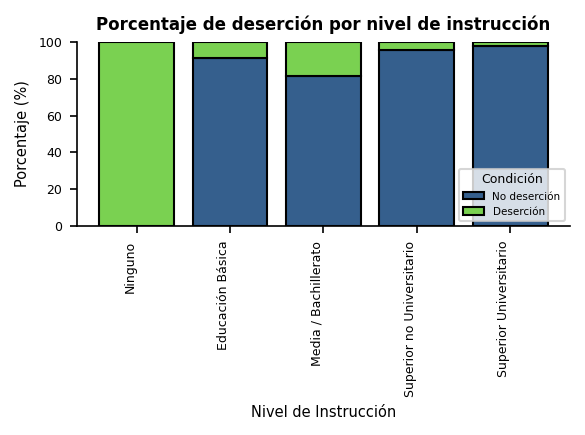


Tabla cruzada (por fila): conteo (porcentaje%)
Condición                    No deserción      Deserción
Nivel                                                   
Ninguno                          0 (0.0%)   143 (100.0%)
Educación Básica            25635 (91.4%)    2412 (8.6%)
Media / Bachillerato       17445 (81.71%)  3904 (18.29%)
Superior no Universitario     114 (95.8%)       5 (4.2%)
Superior Universitario      1012 (97.87%)     22 (2.13%)


In [234]:
map_desercion = {0:"No deserción", 1:"Deserción", "0":"No deserción", "1":"Deserción"}
etiquetas_p10a = {
    1: "Ninguno",
    2: "Centro de alfabetización",
    3: "Jardín de Infantes",
    4: "Primaria",
    5: "Educación Básica",
    6: "Secundaria",
    7: "Media / Bachillerato",
    8: "Superior no Universitario",
    9: "Superior Universitario",
    10: "Postgrado"
}

df["p10a"] = pd.to_numeric(df["p10a"], errors="coerce")
df["Nivel"] = df["p10a"].map(etiquetas_p10a)
df["Condición"] = df["desercion"].map(map_desercion)

tabla_plot = pd.crosstab(df["Condición"], df["Nivel"])
tabla_plot = tabla_plot.loc[:, (tabla_plot.sum(axis=0) > 0)]
orden_cols = [etiquetas_p10a[i] for i in range(1, 11) if etiquetas_p10a.get(i) in tabla_plot.columns]
tabla_plot = tabla_plot.reindex(columns=orden_cols)
prop_plot = (tabla_plot / tabla_plot.sum(axis=0)) * 100

# --- GRÁFICO apilado ---
fig, ax = plt.subplots(figsize=(4, 3), dpi=150)

categorias = ["No deserción", "Deserción"]
cmap = plt.colormaps.get_cmap("viridis")
colores = cmap(np.linspace(0.3, 0.8, len(categorias)))  # <--- corregido: usa len(categorias)

bottom = np.zeros(prop_plot.shape[1])

for c, color in zip(categorias, colores):
    vals = prop_plot.loc[c, :].values if c in prop_plot.index else np.zeros(prop_plot.shape[1])
    ax.bar(prop_plot.columns, vals, bottom=bottom, label=c, color=color, edgecolor="black")
    bottom += vals

ax.set_title("Porcentaje de deserción por nivel de instrucción", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Nivel de Instrucción", fontsize=7)
ax.set_ylabel("Porcentaje (%)", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.set_ylim(0, 100)

ax.tick_params(axis='x', labelsize=6, labelrotation=90)
for label in ax.get_xticklabels():
    label.set_ha("right")
ax.spines[['top', 'right']].set_visible(False)

handles = [
    Patch(facecolor=colores[0], edgecolor="black", label="No deserción"),
    Patch(facecolor=colores[1], edgecolor="black", label="Deserción")
]
ax.legend(handles=handles, title="Condición", fontsize=5, title_fontsize=6,
          frameon=True, loc="lower right")

plt.tight_layout()
plt.show()

# Tabla cruzada
tabla_conteo = pd.crosstab(df["Nivel"], df["Condición"])
tabla_por_fila = pd.crosstab(df["Nivel"], df["Condición"], normalize="index") * 100

tabla_conteo = tabla_conteo.reindex(index=orden_cols, columns=categorias, fill_value=0)
tabla_por_fila = tabla_por_fila.reindex(index=orden_cols, columns=categorias, fill_value=0.0)

tabla_combinada = tabla_conteo.astype(int).astype(str) + " (" + tabla_por_fila.round(2).astype(str) + "%)"
print("\nTabla cruzada (por fila): conteo (porcentaje%)")
print(tabla_combinada)

tabla_conteo_col = pd.crosstab(df["Nivel"], df["Condición"])
tabla_por_col = pd.crosstab(df["Nivel"], df["Condición"], normalize="columns") * 100
tabla_conteo_col = tabla_conteo_col.reindex(index=orden_cols, columns=categorias, fill_value=0)
tabla_por_col = tabla_por_col.reindex(index=orden_cols, columns=categorias, fill_value=0.0)
tabla_combinada_col = tabla_conteo_col.astype(int).astype(str) + " (" + tabla_por_col.round(2).astype(str) + "%)"

df = df.drop(columns=["Nivel", "Condición"], errors="ignore")

### Distribución de clases en en el conjunto de datos

**deserción**: Deserción educativa o escolar

La distribución evidencia un desequilibrio significativo entre las clases, donde la mayoría de los individuos se mantiene dentro del sistema educativo. Esta diferencia de proporciones indica que la variable objetivo está desbalanceada.

Aunque la mayoría de la población analizada no presenta deserción educativa, el 14.54% (12.396 personas) de casos de deserción constituye un segmento relevante que merece especial atención, ya que representa a los individuos más vulnerables dentro del sistema educativo.

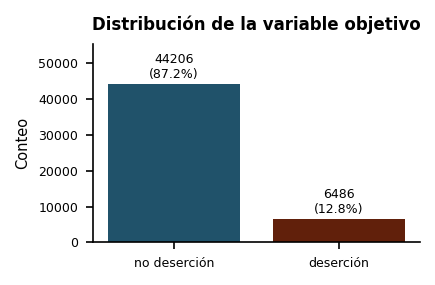

In [235]:
df["desercion"] = df["desercion"].astype(str)

# Etiquetas
etiquetas_desercion = {"0": "no deserción", "1": "deserción"}
df["Etiquetas"] = df["desercion"].map(etiquetas_desercion)

# Resumen con conteo y proporción
resumen_desercion = (df.groupby("Etiquetas", dropna=False).size().reset_index(name="Conteo").sort_values(by="Etiquetas", ascending=True))
resumen_desercion["Proporción (%)"] = round((resumen_desercion["Conteo"] / len(df)) * 100, 2)
orden_etiquetas = ["no deserción", "deserción"]
resumen_desercion = resumen_desercion.set_index("Etiquetas").reindex(orden_etiquetas).reset_index()

# Gráfico de barras
fig, ax = plt.subplots(figsize=(3, 2), dpi=150)
conteos = resumen_desercion["Conteo"].values
etiquetas = resumen_desercion["Etiquetas"].values
porcentajes = resumen_desercion["Proporción (%)"].values

colores = plt.colormaps.get_cmap("berlin")(np.linspace(0.3, 0.7, len(etiquetas)))
bars = ax.bar(etiquetas, conteos, color=colores)

for bar, conteo, porc in zip(bars, conteos, porcentajes):
    height = bar.get_height()
    texto = f"{int(conteo)}\n({porc:.1f}%)"
    ax.text(bar.get_x() + bar.get_width()/2, height + 0.02*max(conteos),
            texto, ha="center", va="bottom", fontsize=6)

ax.set_title("Distribución de la variable objetivo",
             fontsize=8, fontweight="bold", pad=7)
ax.set_ylabel("Conteo", fontsize=7)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, max(conteos) * 1.25)

plt.tight_layout()
plt.show()

df = df.drop(columns=["Etiquetas"], errors="ignore")


En este caso, las clases no tienen la misma representación, lo que indica que se encuentran desbalanceadas.

Por lo cuál, hay que balancear las clases en el conjunto de entranamiento para que nuestro modelo pueda aprender suficiente de cada clase y no priorizar una sobre otra, o incluso predecir siempre una si el desbalance es muy grande.

Los resultados muestran una baja proporción de estudiantes son posibles desertores 12.8%, evidenciando un fuerte desbalance en la variable objetivo.

Por lo tanto, para un modelado más representativo, se ha considerado el oversampling con la finalidad de evitar eliminar registros de “no deserción”.

In [236]:
# Realizar la copia para el cálculo de los indicadores proxy
vars_proxy = ["p03", "escolaridad", "ingrl_wins", "area", "p02", "p04", "desempleo", "desercion", "p07","p08", "p10a", "p10b"]
df_proxy = df[vars_proxy].copy()
vars_conservar = ["area", "p02", "p03", "p04", "desempleo", "escolaridad", "ingrl_wins", "desercion"]
df = df[vars_conservar].copy()

In [237]:
# Partición estratificada
df["desercion"] = pd.to_numeric(df["desercion"], errors="coerce")
X = df.drop(columns=["desercion"])
y = df["desercion"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, stratify=y)

In [238]:
train_df = X_train.copy()
train_df["desercion"] = y_train

counts_train = train_df["desercion"].value_counts()
print("Conteos originales (train):\n", counts_train)

# Separación mayoría/minoría en el conjunto de entreanmiento
df_majority = train_df[train_df["desercion"] == counts_train.idxmax()]
df_minority = train_df[train_df["desercion"] == counts_train.idxmin()]

# Método Oversampling
df_minority_over = resample(
    df_minority,
    replace=True,
    n_samples=len(df_majority),
    random_state=42
)

train_balanced_over = pd.concat([df_majority, df_minority_over]) \
    .sample(frac=1, random_state=42) \
    .reset_index(drop=True)

# Recuperación X_train_bal y y_train_bal
X_train_bal = train_balanced_over.drop(columns=["desercion"])
y_train_bal = train_balanced_over["desercion"]

Conteos originales (train):
 desercion
0    35364
1     5189
Name: count, dtype: int64


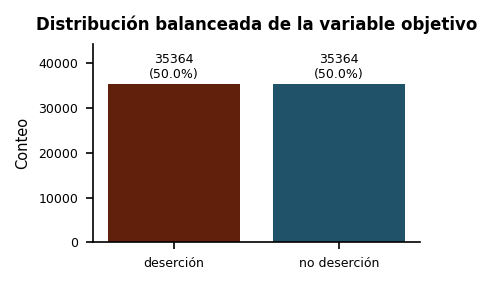

In [239]:
df_bal = pd.DataFrame({"desercion": y_train_bal.astype(str)})

# Etiquetas
etiquetas_desercion = {"0": "no deserción", "1": "deserción"}
df_bal["Etiquetas"] = df_bal["desercion"].map(etiquetas_desercion)

# Resumen con conteo y proporción
resumen_bal = (df_bal.groupby("Etiquetas", dropna=False).size().reset_index(name="Conteo").sort_values(by="Etiquetas", ascending=True))
resumen_bal["Proporción (%)"] = round((resumen_bal["Conteo"] / len(df_bal)) * 100, 2)

orden_etiquetas = ["no deserción", "deserción"]
resumen_bal = resumen_bal.set_index("Etiquetas").reindex(orden_etiquetas).reset_index()

# Gráfico de barras
fig, ax = plt.subplots(figsize=(3, 2), dpi=150)
conteos = df_bal["Etiquetas"].value_counts().sort_index()
colores = plt.colormaps.get_cmap("berlin_r")(np.linspace(0.3, 0.7, len(conteos)))
bars = ax.bar(conteos.index, conteos.values, color=colores)

for bar, (_, row) in zip(bars, resumen_bal.iterrows()):
    height = bar.get_height()
    texto = f"{int(row['Conteo'])}\n({row['Proporción (%)']:.1f}%)"
    ax.text(bar.get_x() + bar.get_width()/2, height + 0.02*max(conteos.values),
            texto, ha="center", va="bottom", fontsize=6)

ax.set_title("Distribución balanceada de la variable objetivo",
             fontsize=8, fontweight="bold", pad=7)
ax.set_ylabel("Conteo", fontsize=7)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim(0, max(conteos.values) * 1.25)

plt.tight_layout()
plt.show()

In [240]:
len(df_bal)

70728

---
# Aprendizaje No Supervisado
---

Mediante técnicas de aprendizaje no supervisado es posible determinar los perfiles de quienes han abandonado el sistema educativo, asociadas factores socieconómicos.

## KMeans



El Análisis de Componentes Principales (PCA) sobre las variables seleccionadas alcanza una varianza acumulada del 68.48% con tres componentes, adecuado para indentificar patrones.

El número óptimo de parámetros fue determiando en conjunto por el método del codo y los valores propios (critereio de Kaiser), de esta manera las tres primeras componentes para el análisis y la segmentación capturan la mayor parte de la variabilidad de los datos.


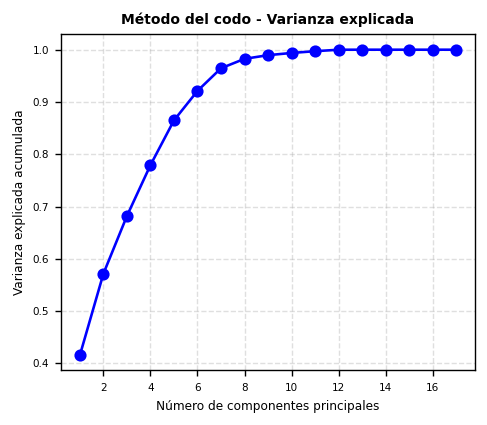

In [241]:
# Preprocesamiento al diferenciar las variables numéricas y categóricas
categoricas = ["area", "p02", "p04", "desempleo"]
numericas   = ["p03", "escolaridad", "ingrl_wins"]

# Separación de variables numpericas y categóricas en el conjunto de entrenamiento
df_cat_train = X_train_bal[categoricas].astype("category")
df_num_train = X_train_bal[numericas].apply(pd.to_numeric, errors="coerce")

# Separación de variables numpericas y categóricas en el conjunto de prueba
df_cat_test = X_test[categoricas].astype("category")
df_num_test = X_test[numericas].apply(pd.to_numeric, errors="coerce")

# Estandarización de las variables numéricas
scaler = StandardScaler()
num_train_scaled = pd.DataFrame(scaler.fit_transform(df_num_train), columns=numericas, index=X_train_bal.index)
num_test_scaled = pd.DataFrame(scaler.transform(df_num_test), columns=numericas, index=X_test.index)

# Estandarización de las variables categóricas
cat_train_enc = pd.get_dummies(df_cat_train, drop_first=False)
cat_test_enc  = pd.get_dummies(df_cat_test,  drop_first=False)

# Alinear columnas del TEST a las del TRAIN (sin “aprender” del test)
cat_test_enc = cat_test_enc.reindex(columns=cat_train_enc.columns, fill_value=0)

# Unión de subconjuntos normalizados
X_train_pre = pd.concat([num_train_scaled, cat_train_enc], axis=1)
X_test_pre  = pd.concat([num_test_scaled,  cat_test_enc ], axis=1)

# Aplicación de ACP
pca = PCA(n_components=3, random_state=123)
X_pca = pca.fit_transform(X_train_pre)
X_test_pca  = pca.transform(X_test_pre)

pca = PCA().fit(X_train_pre)
var_explicada = pca.explained_variance_ratio_
var_acumulada = np.cumsum(var_explicada)

# Gráfico del codo
plt.figure(figsize=(4, 3.5), dpi=125)
plt.plot(range(1, len(var_explicada) + 1), var_acumulada, marker='o', color='blue')
plt.xlabel("Número de componentes principales", fontsize=7)
plt.tick_params(axis='x', labelsize=6)
plt.tick_params(axis='y', labelsize=6)
plt.ylabel("Varianza explicada acumulada", fontsize=7)
plt.title("Método del codo - Varianza explicada", fontsize=8, fontweight="bold")
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

In [242]:
#Criterio de Kaiser por valores propios
for i, var in enumerate(var_acumulada, start=1):
    print(f"Componente {i}: Varianza acumulada = {var:.4f}")

Componente 1: Varianza acumulada = 0.4159
Componente 2: Varianza acumulada = 0.5717
Componente 3: Varianza acumulada = 0.6821
Componente 4: Varianza acumulada = 0.7793
Componente 5: Varianza acumulada = 0.8649
Componente 6: Varianza acumulada = 0.9212
Componente 7: Varianza acumulada = 0.9645
Componente 8: Varianza acumulada = 0.9825
Componente 9: Varianza acumulada = 0.9895
Componente 10: Varianza acumulada = 0.9938
Componente 11: Varianza acumulada = 0.9971
Componente 12: Varianza acumulada = 0.9999
Componente 13: Varianza acumulada = 1.0000
Componente 14: Varianza acumulada = 1.0000
Componente 15: Varianza acumulada = 1.0000
Componente 16: Varianza acumulada = 1.0000
Componente 17: Varianza acumulada = 1.0000


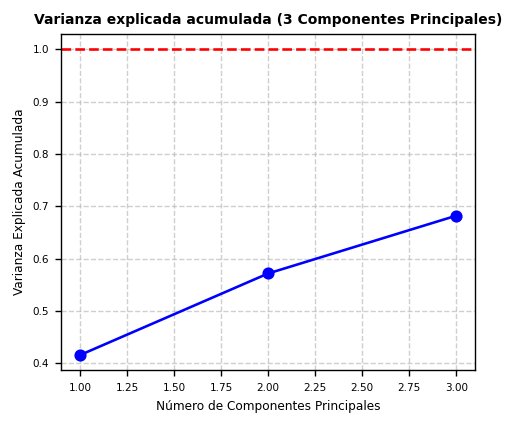

Componente 1: Varianza acumulada = 0.4159
Componente 2: Varianza acumulada = 0.5717
Componente 3: Varianza acumulada = 0.6821


In [243]:
pca = PCA(n_components=3).fit(X_train_pre)

# Varianza explicada y acumulada
var_explicada = pca.explained_variance_ratio_
var_acumulada = np.cumsum(var_explicada)

# Gráfico
plt.figure(figsize=(4, 3.5), dpi=125)
plt.plot(range(1, 4), var_acumulada, 'bo-')
plt.axhline(y=1, color='r', linestyle='--')

plt.title('Varianza explicada acumulada (3 Componentes Principales)',
          fontsize=8, fontweight="bold")
plt.xlabel('Número de Componentes Principales', fontsize=7)
plt.ylabel('Varianza Explicada Acumulada', fontsize=7)
plt.tick_params(axis='x', labelsize=6)
plt.tick_params(axis='y', labelsize=6)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

for i, var in enumerate(var_acumulada, start=1):
    print(f"Componente {i}: Varianza acumulada = {var:.4f}")


In [244]:
sum(pca.explained_variance_ratio_)
var_explicada

array([0.41588027, 0.15584291, 0.11035102])

El gráfico evidencia que hay un nivel aceptable de predicción global en las tres dimensiones, lo cual indica que la deserción sí tiene un patrón identificable en el espacio ACP, aunque con cierta superposición entre grupos.

In [245]:
pca_df = pd.DataFrame(X_pca, columns=['PC1','PC2','PC3'], index=y_train_bal.index) # X_pca = pca.fit_transform(X_train_pre)
pca_df['desercion'] = y_train_bal

fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='desercion',
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Visualización 3D de los Componentes Principales'
)
fig.update_traces(marker=dict(size=4, opacity=0.8))
fig.update_layout(title=dict(
                              text='Visualización 3D de los Componentes Principales',
                              font=dict(size=18, family='Arial', color='black'),
                              x=0.5,  # Centra el título
                              xanchor='center',
                              yanchor='top')
)
fig.show()


In [246]:
k = 3
kmeans = KMeans(n_clusters=k, random_state=123, n_init=10).fit(X_pca)
clusters  = kmeans.labels_
centroids = kmeans.cluster_centers_

# Distancias y etiquetas (train/test) coherentes con k
dist_train = kmeans.transform(X_pca)
dist_test  = kmeans.transform(X_test_pca)
cluster_train = clusters
cluster_test  = kmeans.predict(X_test_pca)

# Construir features con nombres ajustados a k
pc_cols   = [f"PC{i+1}" for i in range(X_pca.shape[1])]
dist_cols = [f"dist_c{i+1}" for i in range(k)]

X_train_km = pd.DataFrame(
    np.hstack([X_pca, dist_train]),
    columns=pc_cols + dist_cols,
    index=y_train_bal.index
)
X_test_km = pd.DataFrame(
    np.hstack([X_test_pca, dist_test]),
    columns=pc_cols + dist_cols,
    index=y_test.index
)

X_train_km["cluster"] = cluster_train
X_test_km["cluster"]  = cluster_test
print("Shape final (train):", X_train_km.shape, "| (test):", X_test_km.shape)

Shape final (train): (70728, 7) | (test): (10139, 7)


In [247]:
y_train_bal = pd.to_numeric(y_train_bal, errors='coerce')
kmeans = KMeans(n_clusters=3, random_state=123, n_init=10)
kmeans.fit(X_pca)
clusters = kmeans.labels_
centroids = kmeans.cluster_centers_

# DataFrame con componentes principales y etiquetas
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'], index=y_train_bal.index)
pca_df["cluster"] = clusters
pca_df["desercion"] = y_train_bal

viridis = plt.colormaps.get_cmap("viridis")(np.linspace(0.2, 0.9, 3))
colores_viridis = [f'rgb({int(r*255)}, {int(g*255)}, {int(b*255)})' for r, g, b, a in viridis]

# Gráfico 3D
fig = go.Figure()
for i, c in enumerate(sorted(pca_df["cluster"].unique())):
    df_c = pca_df[pca_df["cluster"] == c]
    fig.add_trace(go.Scatter3d(
        x=df_c["PC1"], y=df_c["PC2"], z=df_c["PC3"],
        mode='markers',
        marker=dict(
            size=2,
            color=colores_viridis[i],
            opacity=0.75
        ),
        name=f'Cluster {c+1}',
        text=[f"Deserción: {v}" for v in df_c["desercion"]]
    ))

# Centroides
fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers+text',
    marker=dict(size=8, color='red', symbol='diamond'),
    text=[f'Centroide {i+1}' for i in range(centroids.shape[0])],
    textposition='top center',
    name='Centroides'
))
fig.update_layout(
    title=dict(
        text='Clustering K-Means (k = 3)',
        x=0.5,
        font=dict(size=18, family='Arial', color='black')
    ),
    scene=dict(
        xaxis_title='PC 1',
        yaxis_title='PC 2',
        zaxis_title='PC 3',
        xaxis=dict(backgroundcolor="white", gridcolor="lightgray"),
        yaxis=dict(backgroundcolor="white", gridcolor="lightgray"),
        zaxis=dict(backgroundcolor="white", gridcolor="lightgray"),
    ),
    legend_title_text='Clusters',
    margin=dict(l=0, r=0, b=0, t=50)
)
fig.show()

In [248]:
#Coeficiente de silueta promedio
silueta_promedio = silhouette_score(X_pca, cluster_train, metric="cosine")
print("Coeficiente de silueta promedio:", silueta_promedio)

Coeficiente de silueta promedio: 0.49439534789955836


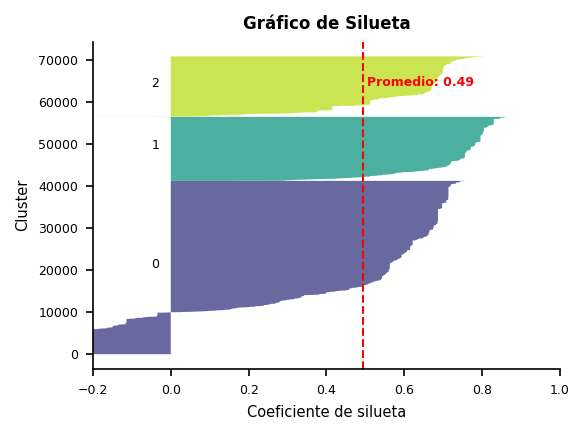

In [249]:
silhouette_vals = silhouette_samples(X_pca, cluster_train, metric="cosine")
silueta_promedio = silhouette_score(X_pca, cluster_train, metric="cosine")
n_clusters = len(np.unique(cluster_train))
y_lower = 10
fig, ax = plt.subplots(figsize=(4, 3), dpi=150)
colormap = plt.colormaps.get_cmap("viridis")(np.linspace(0.2, 0.9, n_clusters))

for i, c in enumerate(np.unique(cluster_train)):
    cluster_vals = silhouette_vals[cluster_train == c]
    cluster_vals.sort()
    cluster_size = cluster_vals.shape[0]
    y_upper = y_lower + cluster_size
    color = colormap[i]

    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_vals,
                     facecolor=color, edgecolor="none", alpha=0.8)
    ax.text(-0.05, y_lower + 0.5 * cluster_size, str(c), fontsize=6)
    y_lower = y_upper + 10

# --- Línea del promedio ---
ax.axvline(x=silueta_promedio, color="red", linestyle="--", linewidth=1)
ax.text(silueta_promedio + 0.01, y_lower * 0.9,
        f"Promedio: {silueta_promedio:.2f}",
        color="red", fontsize=6, fontweight="bold")

# --- Estilo ---
ax.set_title("Gráfico de Silueta", fontsize=8, fontweight="bold", pad=6)
ax.set_xlabel("Coeficiente de silueta", fontsize=7)
ax.set_ylabel("Cluster", fontsize=7)
ax.tick_params(axis='both', labelsize=6)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xlim([-0.2, 1])

plt.tight_layout()
plt.show()


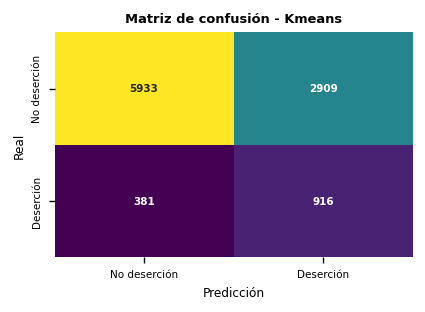

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.94      0.67      0.78      8842
           1       0.24      0.71      0.36      1297

    accuracy                           0.68     10139
   macro avg       0.59      0.69      0.57     10139
weighted avg       0.85      0.68      0.73     10139



In [250]:
lr = LogisticRegression(max_iter=1000, random_state=123, class_weight="balanced")
lr.fit(X_pca, y_train_bal)

y_pred = lr.predict(X_test_pca)
y_proba = lr.predict_proba(X_test_pca)[:, 1]

#Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
etiquetas = ["No deserción", "Deserción"]
plt.figure(figsize=(3.5, 2.6), dpi=125)
sns.heatmap(
    cm,
    annot=True, fmt="d", cmap="viridis", cbar=False,
    xticklabels=etiquetas, yticklabels=etiquetas,
    annot_kws={"size": 6, "fontweight": "bold"}
)

plt.title("Matriz de confusión - Kmeans", fontsize=7.5, fontweight="bold", pad=6)
plt.xlabel("Predicción", fontsize=7)
plt.ylabel("Real", fontsize=7)
plt.xticks(fontsize=6)
plt.yticks(fontsize=6)
plt.tight_layout()
plt.show()

# Evaluación
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))

Reporte de clasificación:
               precision    recall  f1-score   support

No deserción      0.940     0.671     0.783      8842
   Deserción      0.239     0.706     0.358      1297

    accuracy                          0.676     10139
   macro avg      0.590     0.689     0.570     10139
weighted avg      0.850     0.676     0.729     10139

ROC AUC: 0.7196962628598317
PR AUC (Average Precision): 0.2293555757558916


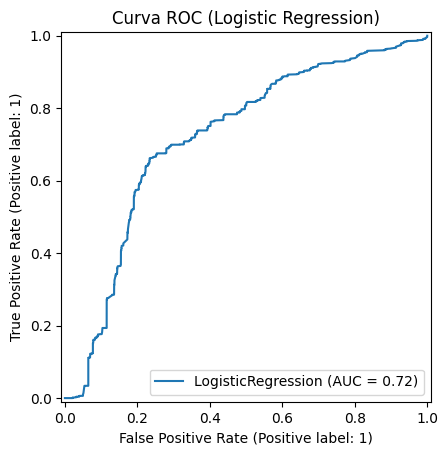

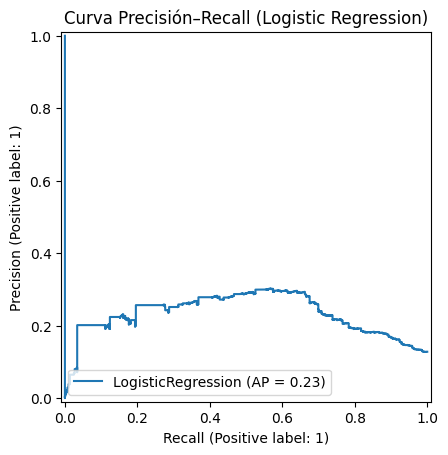

In [251]:
print("Reporte de clasificación:\n", classification_report(y_test, y_pred, target_names=etiquetas, digits=3))

print("ROC AUC:", roc_auc_score(y_test, y_proba))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba))

# Curva ROC
RocCurveDisplay.from_estimator(lr, X_test_pca, y_test)
plt.title("Curva ROC (Logistic Regression)")
plt.show()

# Curva Precisión-Recall
PrecisionRecallDisplay.from_estimator(lr, X_test_pca, y_test)
plt.title("Curva Precisión–Recall (Logistic Regression)")
plt.show()

### Análisis de Perfiles de los Clusters
Una vez que se han asignado los clusters a cada observación, se procede a analizar las características de cada grupo utilizando las variables originales. Esto nos ayudará a entender qué define a cada cluster en términos de edad, escolaridad, ingreso, área, sexo, parentesco y situación de desempleo.

In [252]:
# Etiquetas de cluster (train) y deserción de tipo numérica
cluster_train = kmeans.predict(X_pca)
y_train_bal = pd.to_numeric(y_train_bal, errors='coerce').astype(int)

# Construir nuevamente el dataset con el cjto train balanceado
# Con la finalidad de para perfilar de forma interpretable
data_final = X_train_bal[numericas + categoricas].copy()
data_final["cluster"] = cluster_train
data_final["desercion"] = y_train_bal

# ================== Tasa de deserción por cluster ==================
print("\nProporción de deserción por cluster (train):")
crosstab_des = pd.crosstab(data_final["cluster"], data_final["desercion"],
                           normalize="index").round(3)
# Renombrar columnas si tus clases son 0/1
crosstab_des = crosstab_des.rename(columns={0: "No deserción", 1: "Deserción"})
print(crosstab_des)

# ================== Perfil con las variables numéricas por cluster ==================
cluster_summary_num_mean = data_final.groupby("cluster")[numericas].mean().round(2)
cluster_summary_num_median = data_final.groupby("cluster")[numericas].median().round(2)
cluster_summary_num_std = data_final.groupby("cluster")[numericas].std().round(2)

print("\nPromedio de variables numéricas por cluster (train):")
print(cluster_summary_num_mean)

print("\nMediana de variables numéricas por cluster (train):")
print(cluster_summary_num_median)

print("\nDesviación estandar de variables numéricas por cluster (train):")
print(cluster_summary_num_std)

# ================== Perfil con las variables categóricas por cluster ==================
print("\nDistribución de variables categóricas por cluster (proporciones):")
for col in categoricas:
    dist = (data_final
            .groupby("cluster")[col]
            .value_counts(normalize=True)
            .unstack(fill_value=0)
            .round(3))
    print(f"\n{col}:\n{dist}")

# ================== (Opcional) Tamaños por cluster ==================
print("\nTamaño de cada cluster (train):")
print(data_final["cluster"].value_counts().sort_index())


Proporción de deserción por cluster (train):
desercion  No deserción  Deserción
cluster                           
0                 0.363      0.637
1                 0.704      0.296
2                 0.678      0.322

Promedio de variables numéricas por cluster (train):
           p03  escolaridad  ingrl_wins
cluster                                
0        17.62        12.04      214.05
1        14.45         8.37      109.17
2        14.00         7.46      225.82

Mediana de variables numéricas por cluster (train):
          p03  escolaridad  ingrl_wins
cluster                               
0        18.0         13.0       240.0
1        14.0          8.0       100.0
2        14.0          7.0       230.0

Desviación estandar de variables numéricas por cluster (train):
          p03  escolaridad  ingrl_wins
cluster                               
0        0.96         1.44       44.01
1        1.48         1.62       17.55
2        1.96         2.27       23.85

Distribución de 

---
# Aprendizaje Supervisado
---

## Modelo de Regresión Logística Binaria

In [255]:
X_train_pre_num = (
    X_train_pre
    .apply(pd.to_numeric, errors="coerce")     # fuerza numérico
    .replace([np.inf, -np.inf], np.nan)
    .fillna(0.0)
    .astype(float)
)

y_train_bal_num = pd.to_numeric(y_train_bal, errors="coerce").fillna(0).astype(int)

X_np = X_train_pre_num.to_numpy(dtype=float)
X_const = sm.add_constant(X_np, has_constant="add")  # exog (np.array)
y_np = y_train_bal_num.to_numpy(dtype=float)         # endog (np.array)

# 3) Ajustar GLM Binomial
glm = sm.GLM(y_np, X_const, family=sm.families.Binomial())
res = glm.fit()

# 4) Reconstruir nombres (const + columnas de X)
var_names = ["const"] + list(X_train_pre_num.columns)

or_table = pd.DataFrame({
    "variable": var_names,
    "coef_logit": res.params,
    "odds_ratio": np.exp(res.params),
    "p_value": res.pvalues
}).sort_values("p_value")

print("\n== Tabla de OR + p-values (statsmodels, train balanceado) ==\n")
print(or_table)



== Tabla de OR + p-values (statsmodels, train balanceado) ==

       variable  coef_logit  odds_ratio        p_value
1           p03    1.652713    5.221127   0.000000e+00
2   escolaridad   -1.101295    0.332440   0.000000e+00
13  desempleo_1    1.906252    6.727822   0.000000e+00
4        area_2    0.716774    2.047817  4.182127e-259
5         p02_2   -0.253579    0.776018   5.638244e-38
9         p04_5   -1.266824    0.281725   7.940588e-38
10        p04_7   -1.057930    0.347174   1.760477e-26
7         p04_3   -0.645889    0.524196   5.142803e-12
8         p04_4    0.727111    2.069094   6.717435e-08
12        p04_9   -0.522848    0.592830   1.525166e-05
11        p04_8    1.343697    3.833188   1.745612e-02
3    ingrl_wins    0.013916    1.014013   2.149183e-01
6         p04_2    0.094517    1.099128   5.015759e-01
0         const   -0.035643    0.964985   7.024908e-01



Reporte de clasificación (umbral=0.5):
               precision    recall  f1-score   support

           0      0.963     0.771     0.857      8842
           1      0.339     0.800     0.476      1297

    accuracy                          0.775     10139
   macro avg      0.651     0.786     0.667     10139
weighted avg      0.884     0.775     0.808     10139



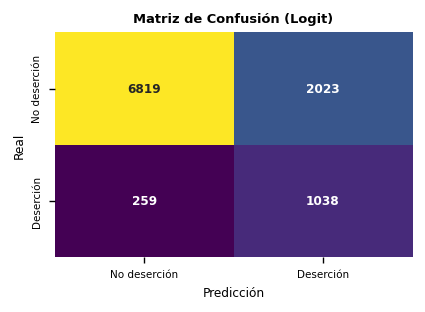


Reporte de clasificación:
               precision    recall  f1-score   support

           0      0.963     0.771     0.857      8842
           1      0.339     0.800     0.476      1297

    accuracy                          0.775     10139
   macro avg      0.651     0.786     0.667     10139
weighted avg      0.884     0.775     0.808     10139


Umbral óptimo (Youden J): 0.570
Accuracy: 0.775 | Precision: 0.339 | Recall: 0.800 | F1: 0.476
ROC-AUC: 0.858
F1 (umbral óptimo): 0.511


In [264]:
logit_skl = LogisticRegression(max_iter=1000, class_weight="balanced", solver="lbfgs")
logit_skl.fit(X_train_pre_num, y_train_bal_num)

y_proba = logit_skl.predict_proba(X_test_pre)[:, 1]
y_pred  = (y_proba >= 0.5).astype(int)

rep = classification_report(y_test, y_pred, digits=3, zero_division=0)
print("\nReporte de clasificación (umbral=0.5):\n", rep)

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred, labels=[0,1])
etiquetas = ["No deserción", "Deserción"]

plt.figure(figsize=(3.5, 2.6), dpi=125)
sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", cbar=False,
            xticklabels=etiquetas, yticklabels=etiquetas,
            annot_kws={"size": 7, "fontweight": "bold"})
plt.title("Matriz de Confusión (Logit)", fontsize=7.5, fontweight="bold", pad=6)
plt.xlabel("Predicción", fontsize=7); plt.ylabel("Real", fontsize=7)
plt.xticks(fontsize=6); plt.yticks(fontsize=6)
plt.tight_layout(); plt.show()

print("\nReporte de clasificación:\n", rep)

fpr, tpr, thr = roc_curve(y_test, y_proba)
youden_idx = np.argmax(tpr - fpr)
best_thr = thr[youden_idx]
print(f"\nUmbral óptimo (Youden J): {best_thr:.3f}")

# Métricas
accuracy_logit  = accuracy_score(y_test, y_pred)
precision_logit = precision_score(y_test, y_pred, zero_division=0)
recall_logit    = recall_score(y_test, y_pred, zero_division=0)
f1_logit        = f1_score(y_test, y_pred, zero_division=0)
auc_logit       = roc_auc_score(y_test, y_proba)

print(f"Accuracy: {accuracy_logit:.3f} | Precision: {precision_logit:.3f} | Recall: {recall_logit:.3f} | F1: {f1_logit:.3f}")
print("ROC-AUC:", round(auc_logit, 3))
y_best = (y_proba >= best_thr).astype(int)
print("F1 (umbral óptimo):", round(f1_score(y_test, y_best, zero_division=0), 3))

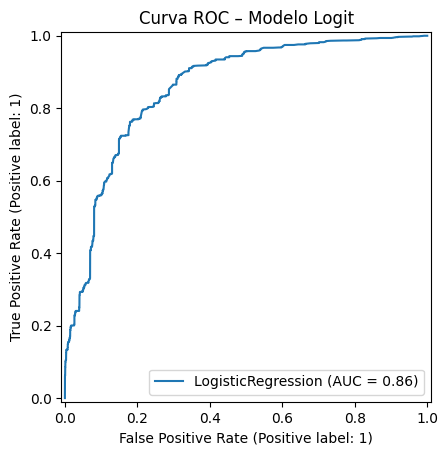

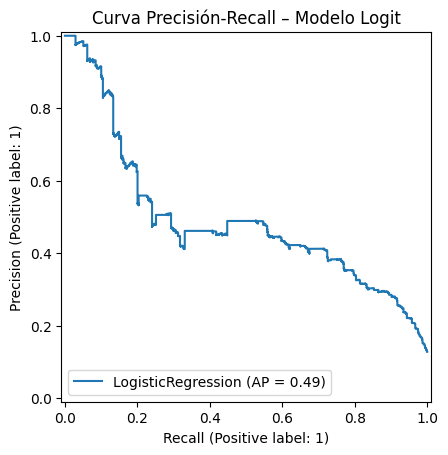

In [269]:
# Curvas
RocCurveDisplay.from_estimator(logit_skl, X_test_pre, y_test)
plt.title("Curva ROC – Modelo Logit")
plt.show()

PrecisionRecallDisplay.from_estimator(logit_skl, X_test_pre, y_test)
plt.title("Curva Precisión-Recall – Modelo Logit")
plt.show()

## Modelo Random Forest

In [272]:
param_dist = {
    "n_estimators":      sp_randint(100, 401),
    "max_depth":         [5, 10, 15, None],
    "min_samples_split": sp_randint(2, 11),
    "min_samples_leaf":  sp_randint(1, 6),
    "max_features":      ["sqrt", "log2"]
}
rf = RandomForestClassifier(random_state=123, class_weight="balanced")

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=30,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    random_state=123,
    verbose=2
)
random_search.fit(X_train, y_train)

print("Mejores hiperparámetros:", random_search.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Mejores hiperparámetros: {'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 9, 'n_estimators': 176}


In [273]:
modelo_rf = RandomForestClassifier(
    n_estimators=176,
    max_depth=15,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=9,
    random_state=123,
    n_jobs=-1,
    class_weight="balanced",
)
modelo_rf.fit(X_train, y_train)

# Predicciones y evaluación
y_pred = modelo_rf.predict(X_test)
y_proba = modelo_rf.predict_proba(X_test)[:, 1]

accuracy_rf = accuracy_score(y_test, y_pred)
precision_rf = precision_score(y_test, y_pred)
recall_rf = recall_score(y_test, y_pred)
f1_rf   = f1_score(y_test, y_pred, zero_division=0)
roc_rf  = roc_auc_score(y_test, y_proba)
apr_rf  = average_precision_score(y_test, y_proba)

print("Accuracy:", accuracy_rf)
print("Precision:", precision_rf)
print("Recall:", recall_rf)
print("F1-score", f1_rf)
print("ROC-AUC", roc_rf)
print("PR-AUC", apr_rf)

Accuracy: 0.930762402603807
Precision: 0.6710753306497987
Recall: 0.899768696993061
F1-score 0.7687747035573123
ROC-AUC 0.9684512412459145
PR-AUC 0.9000946878383538


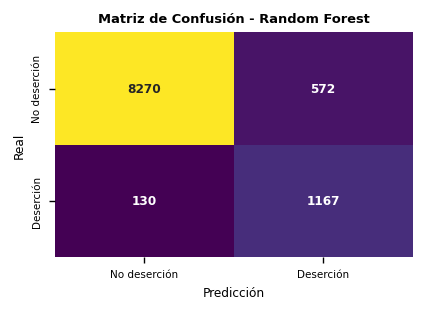


Reporte de Clasificación:
              precision    recall  f1-score   support

No deserción      0.985     0.935     0.959      8842
   Deserción      0.671     0.900     0.769      1297

    accuracy                          0.931     10139
   macro avg      0.828     0.918     0.864     10139
weighted avg      0.944     0.931     0.935     10139

ROC-AUC: 0.968


In [274]:
# Matriz de confusión
etiquetas = ["No deserción", "Deserción"]
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(3.5, 2.6), dpi=125)
sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", cbar=False,
            xticklabels=etiquetas, yticklabels=etiquetas,
            annot_kws={"size": 7, "fontweight": "bold"})
plt.title("Matriz de Confusión - Random Forest", fontsize=7.5, fontweight="bold", pad=6)
plt.xlabel("Predicción", fontsize=7);
plt.ylabel("Real", fontsize=7)
plt.xticks(fontsize=6);
plt.yticks(fontsize=6)
plt.tight_layout()
plt.show()

# Métricas de rendimiento
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred, target_names=etiquetas, digits=3))
print("ROC-AUC:", round(roc_auc_score(y_test, y_proba), 3))

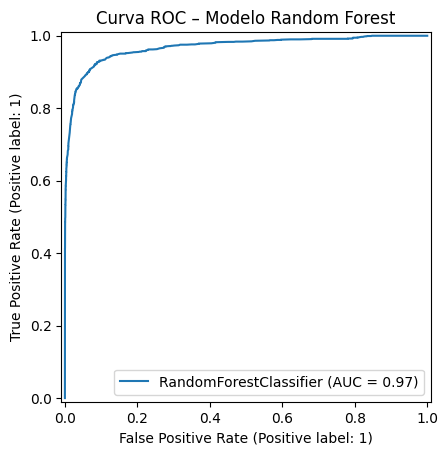

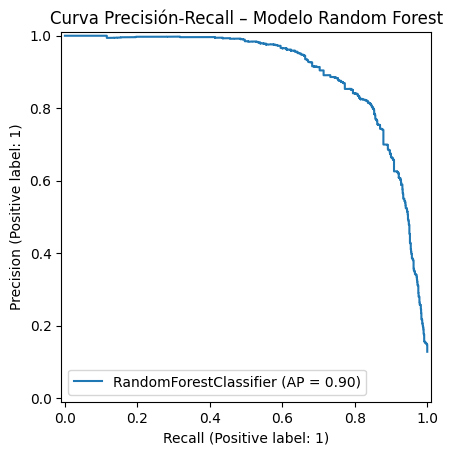

In [275]:
# Curvas
RocCurveDisplay.from_estimator(modelo_rf, X_test, y_test)
plt.title("Curva ROC – Modelo Random Forest")
plt.show()

PrecisionRecallDisplay.from_estimator(modelo_rf, X_test, y_test)
plt.title("Curva Precisión-Recall – Modelo Random Forest")
plt.show()

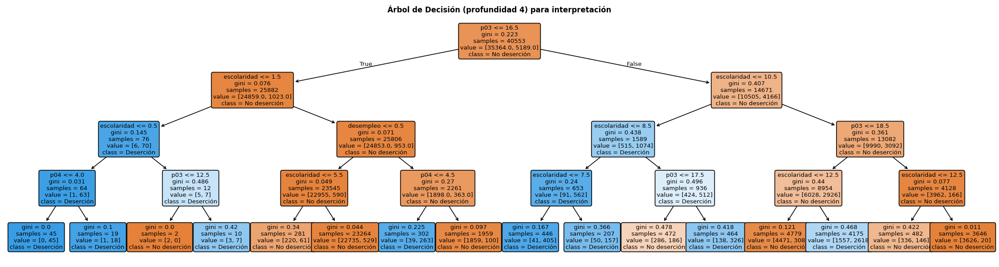

In [276]:
arbol_simple = DecisionTreeClassifier(
    max_depth=4,   # controla la profundidad
    random_state=123
)
arbol_simple.fit(X_train, y_train)

plt.figure(figsize=(24, 6), dpi=120)
tree.plot_tree(
    arbol_simple,
    feature_names=X_train.columns,
    class_names=["No deserción", "Deserción"],
    filled=True,
    rounded=True,
    fontsize=8
)
plt.title("Árbol de Decisión (profundidad 4) para interpretación", fontsize=10, fontweight="bold")
plt.show()


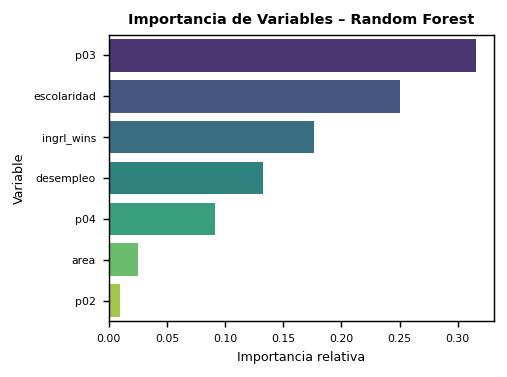


Top variables más importantes:
p03            0.315
escolaridad    0.250
ingrl_wins     0.177
desempleo      0.132
p04            0.091
area           0.025
p02            0.009
dtype: float64


In [277]:
# Importancia de variables (equivalente a varImpPlot)
importances = pd.Series(modelo_rf.feature_importances_, index=X_train.columns)
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(4, 3), dpi=130)
sns.barplot(x=importances.values, y=importances.index, palette="viridis")
plt.title("Importancia de Variables – Random Forest", fontsize=8, fontweight="bold")
plt.xlabel("Importancia relativa", fontsize=7)
plt.ylabel("Variable", fontsize=7)
plt.tick_params(axis='x', labelsize=6)
plt.tick_params(axis='y', labelsize=6)
plt.tight_layout()
plt.show()

print("\nTop variables más importantes:")
print(importances.head(10).round(3))

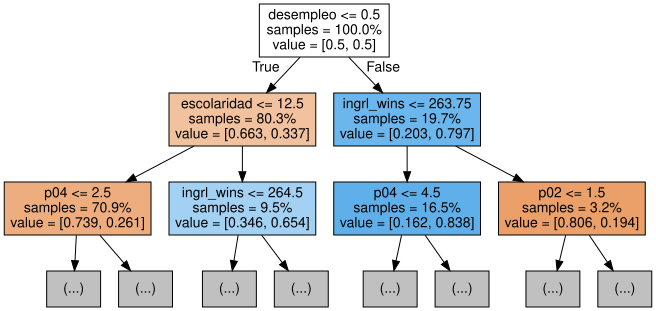

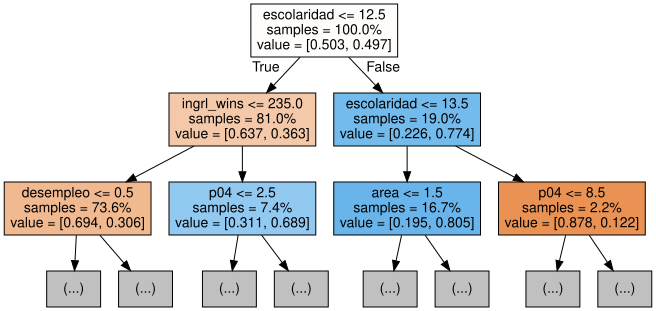

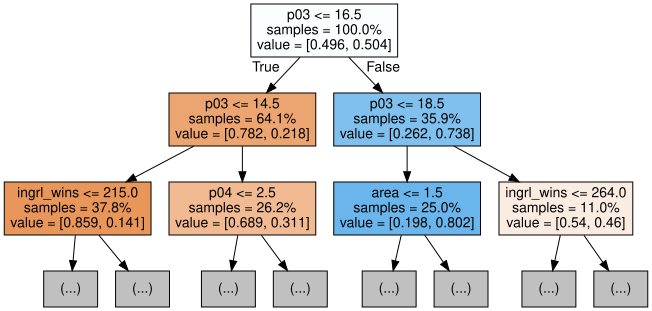

In [278]:
# Para saber como cada árbol aprende las reglas de clasificación
for i in range(3):
    tree = modelo_rf.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train.columns,
                               filled=True,
                               max_depth=2,
                               impurity=False,
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

In [279]:
# validacion cruzada
modelo_rf = RandomForestClassifier(
    n_estimators=176,
    max_depth=15,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=9,
    random_state=123,
    n_jobs=-1,
    class_weight="balanced",
)

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# Métricas típicas para clasificación binaria
scores_acc = cross_val_score(modelo_rf, X_train, y_train, cv=cv, scoring='accuracy', n_jobs=-1)
scores_f1  = cross_val_score(modelo_rf, X_train, y_train, cv=cv, scoring=make_scorer(f1_score), n_jobs=-1)
scores_auc = cross_val_score(modelo_rf, X_train, y_train, cv=cv, scoring='roc_auc', n_jobs=-1)

print(f"ACC media: {scores_acc.mean():.3f} ± {scores_acc.std():.3f}")
print(f"F1  media: {scores_f1.mean():.3f} ± {scores_f1.std():.3f}")
print(f"AUC media: {scores_auc.mean():.3f} ± {scores_auc.std():.3f}")

ACC media: 0.931 ± 0.003
F1  media: 0.768 ± 0.010
AUC media: 0.966 ± 0.003


In [280]:
# Crear un nuevo caso idéntico al esquema del entrenamiento, para predecir la probabilidad de deserción
nuevo_caso =  {
  'area': "1",
  'p02': "1",
  'p03': 15,
  'p04': "3",
  'desempleo': "0",
  'escolaridad': 9,
  'ingrl_wins': 150
}

caso = pd.DataFrame([nuevo_caso])

# Definición el modelo
modelo_rf = RandomForestClassifier(
    n_estimators=176,
    max_depth=15,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=9,
    random_state=123,
    n_jobs=-1,
    class_weight="balanced",
)
modelo_rf.fit(X_train, y_train)
modelo_rf.predict_proba(caso)

array([[0.90463586, 0.09536414]])

## Comparación de modelos

In [282]:
# Comparación de métricas de amboss modelos
modelos = ["Logit", "Random Forest"]
resultados = pd.DataFrame({
    "Modelo": modelos,
    "Accuracy": [accuracy_logit, accuracy_rf],
    "Precision": [precision_logit, precision_rf],
    "Recall": [recall_logit, recall_rf],
    "F1": [f1_logit, f1_rf],
})

resultados

,Modelo,Accuracy,Precision,Recall,F1
0,Logit,0.774928,0.339105,0.800308,0.476365
1,Random Forest,0.930762,0.671075,0.899769,0.768775


---
# Indicador Proxy de impacto de programas de bachillerato acelerado
---

In [301]:
DF = df_proxy.copy()
COLS = ["p07", "p08", "p10a"]

faltantes = [c for c in COLS if c not in DF.columns]
if faltantes:
    raise KeyError(f"Faltan columnas requeridas: {faltantes}")

def _to_num(s):
    # Maneja strings tipo " 3", "6 ", "NA", "", etc.
    if s.dtype == object:
        s = s.astype(str).str.strip().replace({"": np.nan, "NA": np.nan, "NaN": np.nan})
    return pd.to_numeric(s, errors="coerce")

for c in COLS:
    DF[c] = _to_num(DF[c])

for c in COLS:
    na_cnt = DF[c].isna().sum()
    zero_cnt = (DF[c] == 0).sum(skipna=True)

# =========================
# 3) Construcción de máscaras (condiciones de Bachillerato acelerado)
#    - p07 == 1 (asiste)
#    - p10a <= 7 (nivel hasta bachillerato)
#    - p08 in {3,6} (nocturna o a distancia)
#    - excluir ceros e inválidos (p08 != 0, p10a != 0)
# =========================
m_asiste     = (DF["p07"] == 1)
m_nivel      = (DF["p10a"] <= 7)
m_modalidad  = DF["p08"].isin([3, 6])
m_validos    = (DF["p10a"] != 0) & (DF["p08"] != 0) & DF["p10a"].notna() & DF["p08"].notna() & DF["p07"].notna()

m_final = m_asiste & m_nivel & m_modalidad & m_validos
DF_filtrado = DF[m_final].copy()

print("Proporción del universo elegible en educación acelerada: {:.2f}%".format(100 * len(DF_filtrado) / len(DF) if len(DF) else 0))

Proporción del universo elegible en educación acelerada: 2.02%
